# Importing Modules used in this notebook

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from numpy.linalg import norm, cholesky, LinAlgError
from scipy.optimize import line_search

# Rosenbrock Function

In [3]:
def Rosenbrock(x1,x2):
  return (1 - x1)**2 + 10*(x2 - x1*x1)**2


# Visualization of Rosenbrock

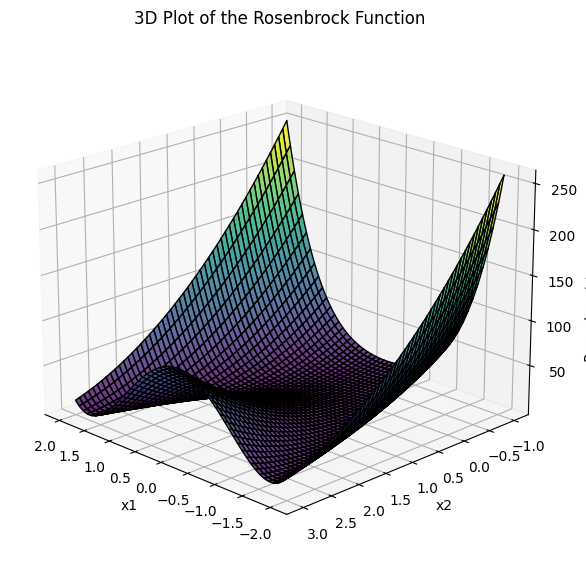

In [4]:
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)

# Plot the 3D surface
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, Z, cmap='viridis', edgecolor='k', alpha=0.8)
ax.view_init(elev=20, azim=135)


ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('Rosenbrock(x1, x2)')
ax.set_title('3D Plot of the Rosenbrock Function')

plt.show()

# Gradient Decent

In [5]:
def grad_f(x1, x2):
    """
    Compute the gradient of the Rosenbrock function at the point (x1, x2).
    """
    dfdx1 = -2 * (1 - x1) - 40 * x1 * (x2 - x1**2)
    dfdx2 = 20 * (x2 - x1**2)
    return dfdx1, dfdx2

def gradient_descent(f, grad_f, x0, epsilon=1e-6, max_iters=1000, alpha=0.01):
    """
    Parameters:
    - f: The function to minimize.
    - grad_f: The gradient of f, a function returning (df/dx1, df/dx2).
    - x0: The initial guess as a tuple (x1, x2).
    - epsilon: Stopping threshold for the gradient norm.
    - max_iters: Maximum number of iterations.
    - alpha: Step size (learning rate).

    Returns:
    - x: Approximation of the local minimum as a tuple (x1, x2).
    """
    x1, x2 = x0  # Start with the initial guess
    k = 0
    visited_points = []

    while k < max_iters:
        # Compute the gradient at the current point
        grad_x1, grad_x2 = grad_f(x1, x2)
        grad_norm = np.sqrt(grad_x1**2 + grad_x2**2)  # Norm of the gradient

        # Stopping criterion: gradient norm is small enough
        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        x1 = x1 - alpha * grad_x1
        x2 = x2 - alpha * grad_x2

        x = (x1, x2)
        k += 1
        visited_points.append(x)


    return x, visited_points

## Visualize working of Gradient Descent over constant alpha

In [6]:
x0 = (1.00, -1.70) #guess or initial point

solution1,points1 = gradient_descent(Rosenbrock, grad_f, x0, epsilon=1e-6, alpha=0.022)  # alpha = 0.022

solution2,points2 = gradient_descent(Rosenbrock, grad_f, x0, epsilon=1e-6, alpha=0.01)  # alpha = 0.01

solution3,points3 = gradient_descent(Rosenbrock, grad_f, x0, epsilon=1e-6, alpha=0.02)  # alpha = 0.02


In [7]:
def plot_rosenbrock_with_points(X1, X2, Z, points, trial_num):
    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X1, X2, Z, cmap='viridis', edgecolor='k', alpha=0.8)
    ax.view_init(elev=30, azim=20)

    # Plot the points and connect them with a red line
    x_points = [p[0] for p in points]
    y_points = [p[1] for p in points]
    z_points = [Rosenbrock(p[0], p[1]) for p in points]

    # Elevate the z_points slightly for visibility
    z_points_above = [z + 1 for z in z_points]  # Adjust this value as needed

    ax.plot(x_points, y_points, z_points_above, color='red', marker='o', markersize=5, linestyle='-', linewidth=2, label="Trial Path")

    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('Rosenbrock(x1, x2)')
    ax.set_title(f'3D Plot of the Rosenbrock Function - Trial {trial_num}')
    ax.legend()
    plt.show()

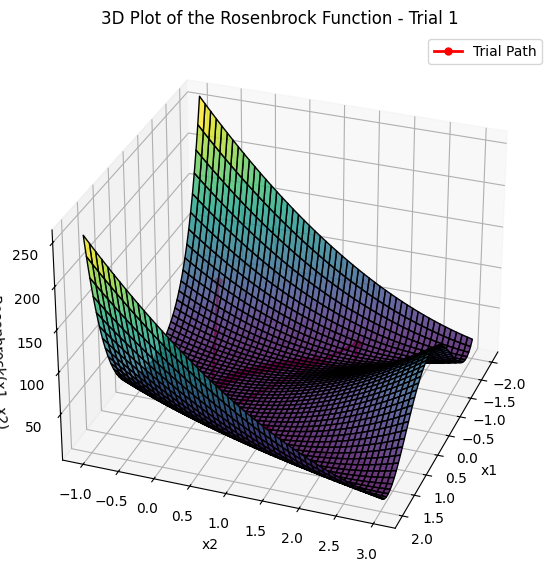

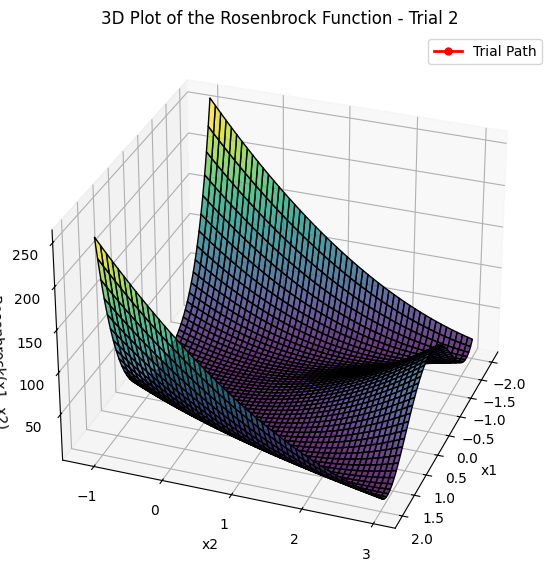

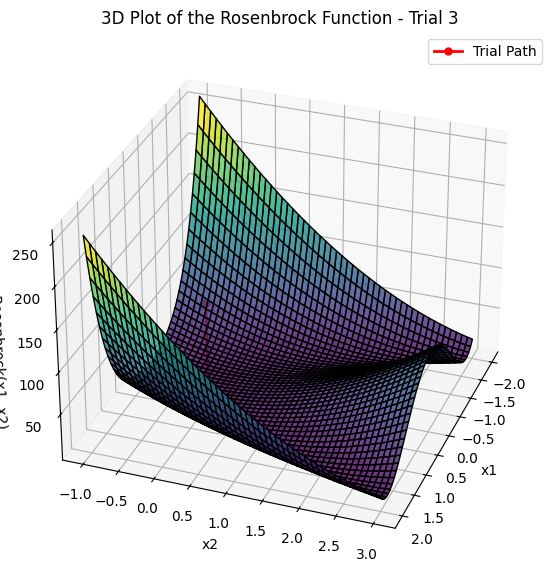

In [8]:
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)

trials = [list(points1), list(points2), list(points3)]

for i, trial in enumerate(trials, start=1):
    plot_rosenbrock_with_points(X1, X2, Z, trial, trial_num=i)



## Gradient Decent over Exact line search

In [9]:
def gradient_descent_exact_line_search(f, grad_f, x0, epsilon=1e-6, max_iter=1000):
    """
    Perform gradient descent with exact line search in 2D space.

    Parameters:
    - f: function, a smooth loss function f: ℝ2 → ℝ
    - grad_f: function, the gradient of f: ℝ2 → ℝ2, returns (df/dx1, df/dx2)
    - x0: array-like, initial guess for the optimization solution (x1, x2)
    - epsilon: float, tolerance for stopping criterion
    - max_iter: int, maximum number of iterations to prevent infinite loops

    Returns:
    - x_star: array, local minima of the loss function (x1*, x2*)
    - visited_points: list of points visited during the optimization
    """
    x_k = np.array(x0)
    visited_points = [x_k.copy()]  # Initialize visited points list with the starting point
    k = 0

    while k < max_iter:
        # Compute the gradient at the current point
        grad = np.array(grad_f(x_k[0], x_k[1]))
        norm_grad = np.linalg.norm(grad)

        # Check stopping criteria
        if norm_grad < epsilon:
            break

        # Exact line search: find alpha that minimizes f(x_k - alpha * grad)
        alpha_k = minimize_line_search(f, x_k, grad)

        # Update the components
        x_k = x_k - alpha_k * grad

        # Append the new position to the visited points
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points  # Return both the local minimum and the visited points

def minimize_line_search(f, x_k, grad):
    """
    Perform exact line search to find the optimal alpha.

    Parameters:
    - f: function, the objective function
    - x_k: array-like, current position in the optimization
    - grad: array-like, gradient at current position

    Returns:
    - alpha: optimal step size that minimizes f along the gradient direction
    """
    # Define the function to minimize
    def line_search_func(alpha):
        return f(x_k[0] - alpha * grad[0], x_k[1] - alpha * grad[1])

    # Use a simple grid search or optimization method to find the minimum
    alpha_values = np.linspace(0, 1, 100)  # Try values between 0 and 1
    f_values = [line_search_func(alpha) for alpha in alpha_values]

    # Find the alpha that gives the minimum function value
    min_index = np.argmin(f_values)
    return alpha_values[min_index]

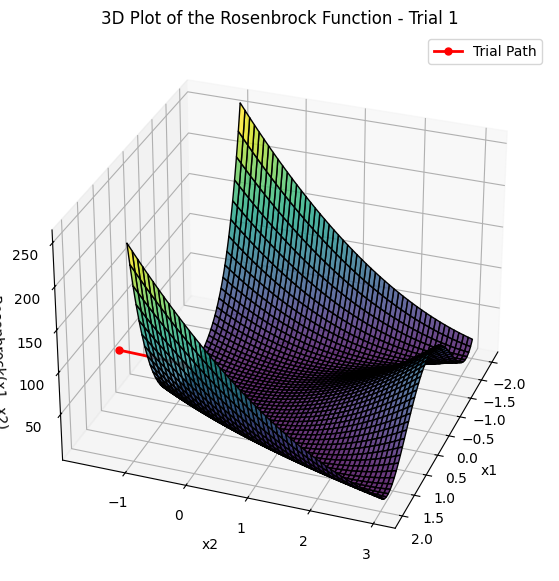

In [10]:
outer, points = gradient_descent_exact_line_search(Rosenbrock, grad_f, x0, epsilon=1e-6)
#print(points)

trial = [list(x) for x in points]

plot_rosenbrock_with_points(X1, X2, Z, trial, trial_num=1)

# Armijo Rule

In [11]:
def armijo_gradient_descent(f, grad_f, x0, epsilon=1e-6, max_iter=1000, c1=1e-4, beta=0.5):
    """
    Perform gradient descent with Armijo backtracking line search in 2D space.
    """
    x_k = np.array(x0)
    visited_points = [x_k.copy()]  # Track visited points
    k = 0

    while k < max_iter:
        grad = np.array(grad_f(x_k[0], x_k[1]))
        grad_norm = np.linalg.norm(grad)

        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        alpha_k = 1.0

        # Armijo backtracking line search
        while f(*(x_k - alpha_k * grad)) > f(*x_k) - c1 * alpha_k * np.dot(grad, grad):
            alpha_k *= beta

        x_k = x_k - alpha_k * grad
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points

In [12]:
def plot_rosenbrock_with_points(X1, X2, Z, points, trial_num, type, zoom_xlim=None, zoom_ylim=None):
    fig, (ax3d, ax2d) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [1, 1]})

    # 3D Plot
    ax3d = fig.add_subplot(121, projection='3d')
    ax3d.plot_surface(X1, X2, Z, cmap='viridis', edgecolor='k', alpha=0.4)
    ax3d.view_init(elev=40, azim=30)

    # Extract coordinates for path points
    x_points = [p[0] for p in points]
    y_points = [p[1] for p in points]
    z_points = [Rosenbrock(p[0], p[1]) for p in points]
    z_points_above = [z + 5 for z in z_points]

    # Plot optimization path on 3D surface
    ax3d.plot(x_points, y_points, z_points_above, color='red', marker='o', markersize=6, linestyle='-', linewidth=2, label="Optimization Path")

    # Highlight the final point
    final_point = points[-1]
    final_z = Rosenbrock(final_point[0], final_point[1]) + 5
    ax3d.scatter(final_point[0], final_point[1], final_z, color='blue', s=100, label='Final Point', edgecolors='black', zorder=5)

    ax3d.set_xlabel('x1')
    ax3d.set_ylabel('x2')
    ax3d.set_zlabel('Rosenbrock(x1, x2)')
    ax3d.legend()

    # 2D Contour Plot (Zoomed)
    ax2d.contourf(X1, X2, Z, levels=50, cmap='viridis', alpha=0.7)
    ax2d.contour(X1, X2, Z, levels=50, colors='black', linewidths=0.5)
    ax2d.plot(x_points, y_points, color='red', marker='o', markersize=4, linestyle='-', linewidth=1.5, label="Optimization Path")
    ax2d.scatter(final_point[0], final_point[1], color='blue', s=60, label='Final Point', edgecolors='black', zorder=5)

    # Set zoomed limits if provided
    if zoom_xlim:
        ax2d.set_xlim(zoom_xlim)
    if zoom_ylim:
        ax2d.set_ylim(zoom_ylim)

    ax2d.set_xlabel('x1')
    ax2d.set_ylabel('x2')
    ax2d.legend()

    # Save and show the plot
    plt.show()


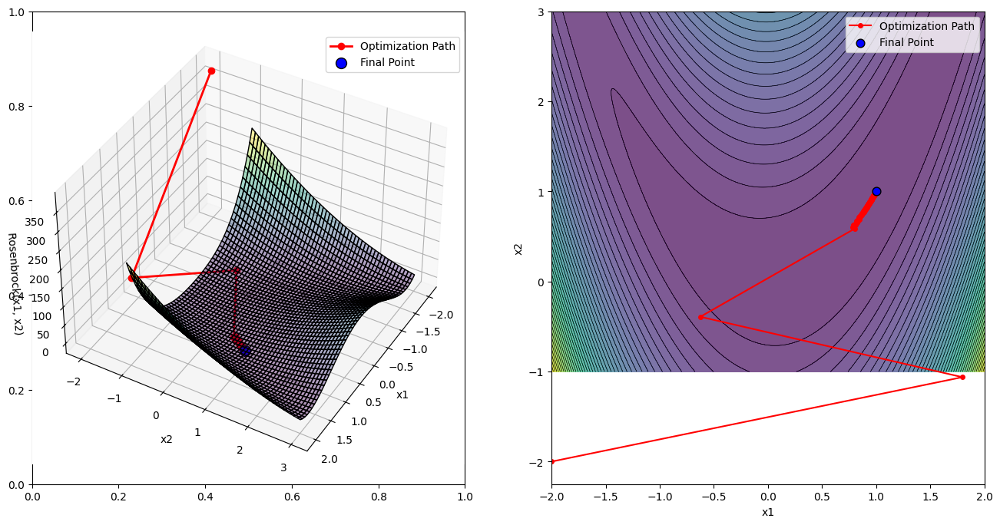

In [13]:
def Rosenbrock(x1,x2):
  return (1 - x1)**2 + 10*(x2 - x1*x1)**2


def grad_f(x1, x2):
    """
    Compute the gradient of the Rosenbrock function at the point (x1, x2).
    """
    dfdx1 = -2 * (1 - x1) - 40 * x1 * (x2 - x1**2)
    dfdx2 = 20 * (x2 - x1**2)
    return dfdx1, dfdx2

x0 = (-2.00, -2.00)  # Initial point

# Generate a grid for visualization
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)
# Run Armijo gradient descent
opt_point, visited_points = armijo_gradient_descent(Rosenbrock, grad_f, x0, epsilon=1e-6)

# Prepare points for plotting
trial_points = [list(x) for x in visited_points]

# Plot Rosenbrock function and points visited by Armijo gradient descent
plot_rosenbrock_with_points(X1, X2, Z, trial_points, trial_num=1, type="armijo_backtracking")


# Momentum based GD

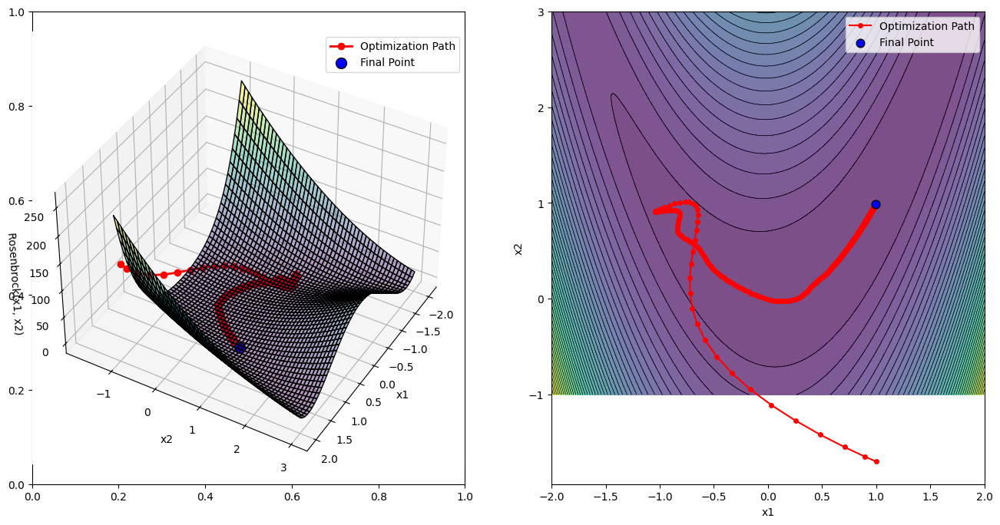

In [14]:

def momentum_gradient_descent(f, grad_f, x0, alpha=0.01, gamma=0.9, epsilon=1e-6, max_iter=1000):
    """
    Perform momentum-based gradient descent in 2D space.

    Parameters:
    - f: function, a smooth loss function f: ℝ^n → ℝ
    - grad_f: function, the gradient of f: ℝ^n → ℝ^n
    - x0: array-like, initial guess for the optimization solution (x1, x2)
    - alpha: float, learning rate
    - gamma: float, momentum coefficient in (0,1)
    - epsilon: float, tolerance for stopping criterion
    - max_iter: int, maximum number of iterations

    Returns:
    - x_star: array, local minima of the loss function (x1*, x2*)
    - visited_points: list of points visited during the optimization
    """
    x_k = np.array(x0)
    v_k = np.zeros_like(x_k)  # Initial momentum vector
    visited_points = [x_k.copy()]
    k = 0

    while k < max_iter:
        grad = np.array(grad_f(x_k[0], x_k[1]))
        grad_norm = np.linalg.norm(grad)

        # Check stopping criterion
        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        # Update momentum
        v_k = gamma * v_k + alpha * grad
        # Update position
        x_k = x_k - v_k
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points

# Set parameters
x0 = (1.0, -1.7)  # Initial point
alpha = 0.001  # Learning rate
gamma = 0.9    # Momentum coefficient

# Run Momentum-based Gradient Descent
opt_point, visited_points = momentum_gradient_descent(Rosenbrock, grad_f, x0, alpha=alpha, gamma=gamma, epsilon=1e-6)

# Prepare points for plotting
trial_points = [list(x) for x in visited_points]

# Plot Rosenbrock function and points visited by Momentum Gradient Descent
plot_rosenbrock_with_points(X1, X2, Z, trial_points, trial_num=1, type="momentum_gd")


# Nesterov accelerated gradient descent (NGD)

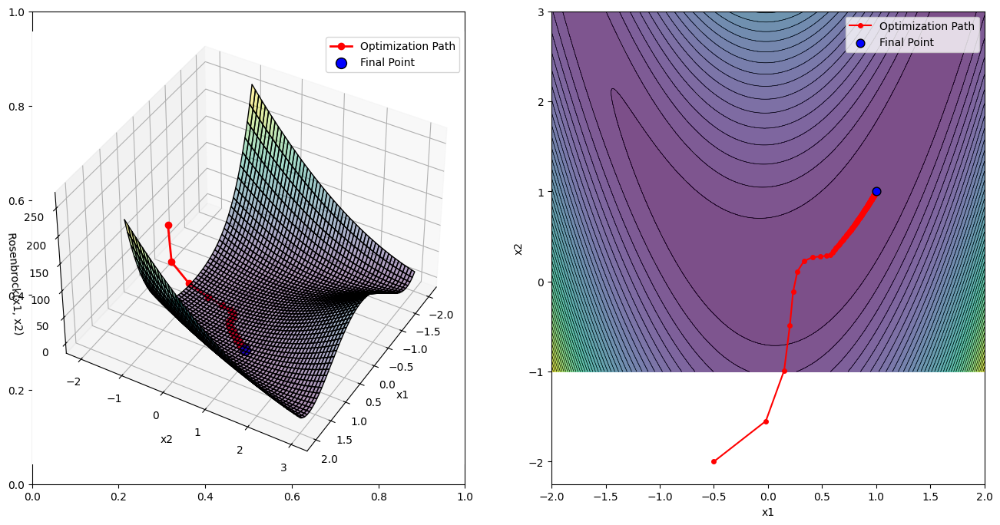

In [30]:

def nesterov_gradient_descent(f, grad_f, x0, alpha=0.01, gamma=0.9, epsilon=1e-6, max_iter=1000):
    """
    Perform Nesterov Accelerated Gradient Descent (NAG) on a smooth function.
    
    Parameters:
    - f: function, a smooth loss function f: ℝ^n → ℝ
    - grad_f: function, the gradient of f: ℝ^n → ℝ^n
    - x0: array-like, initial guess for the optimization solution (x1, x2)
    - alpha: float, learning rate
    - gamma: float, momentum coefficient in (0,1)
    - epsilon: float, tolerance for stopping criterion
    - max_iter: int, maximum number of iterations

    Returns:
    - x_star: array, local minima of the loss function (x1*, x2*)
    - visited_points: list of points visited during the optimization
    """
    x_k = np.array(x0)
    v_k = np.zeros_like(x_k)  # Initialize momentum vector
    visited_points = [x_k.copy()]
    k = 0

    while k < max_iter:
        # Look-ahead position
        x_lookahead = x_k - gamma * v_k
        # Compute gradient at look-ahead position
        grad = np.array(grad_f(x_lookahead[0], x_lookahead[1]))
        grad_norm = np.linalg.norm(grad)

        # Check stopping criterion
        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        # Update momentum with gradient at look-ahead position
        v_k = gamma * v_k + alpha * grad
        # Update position
        x_k = x_k - v_k
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points


def grad_f(x1, x2):
    """
    Compute the gradient of the Rosenbrock function at the point (x1, x2).
    """
    dfdx1 = -2 * (1 - x1) - 40 * x1 * (x2 - x1**2)
    dfdx2 = 20 * (x2 - x1**2)
    return dfdx1, dfdx2

# Set initial conditions and parameters
x0 = (-0.5, -2.0)  # Initial point
alpha = 0.01  # Learning rate
gamma = 0.65    # Momentum coefficient

opt_point, visited_points = nesterov_gradient_descent(Rosenbrock, grad_f, x0, alpha=alpha, gamma=gamma, epsilon=1e-6)

# Prepare for plotting
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)

# Convert visited points to list format
trial_points = [list(x) for x in visited_points]

# Plot the result
plot_rosenbrock_with_points(X1, X2, Z, trial_points, trial_num=1, type="nesterov_gd_modified")


# Linear Regression

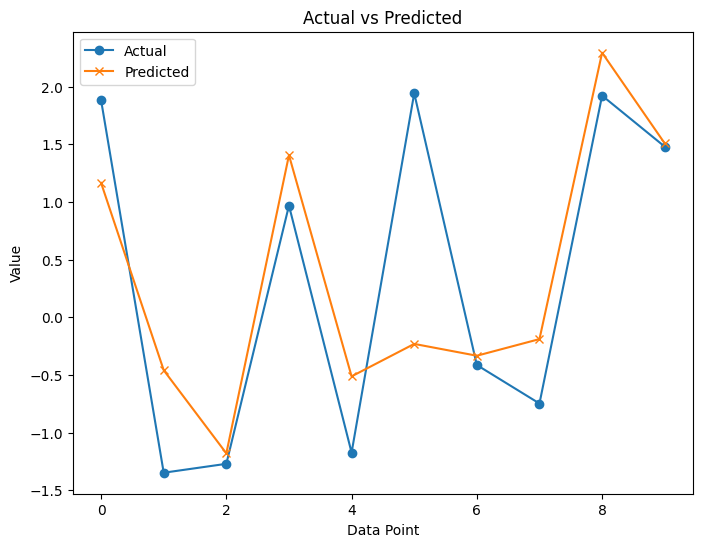

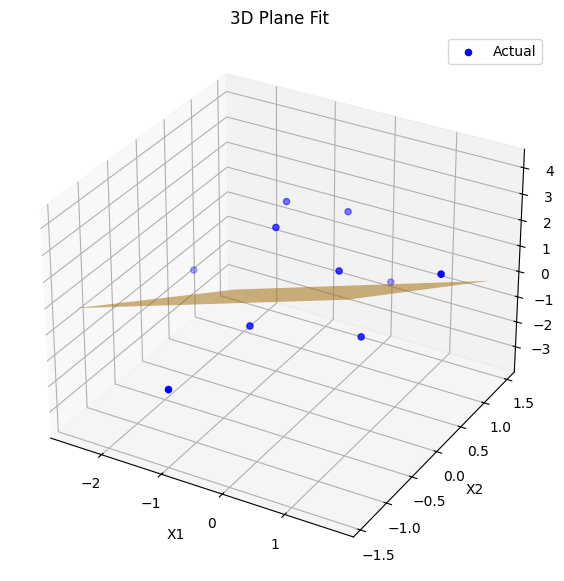

In [31]:

# Gradient Descent for Linear Regression
def linear_regression_gd(X, Y, alpha, max_iter):
    N, d = X.shape
    X_aug = np.hstack((np.ones((N, 1)), X))
    W = np.random.randn(d + 1, 1)
    
    for k in range(max_iter):
        Y_pred = X_aug @ W
        E = Y_pred - Y
        grad = (1 / N) * (X_aug.T @ E)
        W = W - alpha * grad
    return W, Y_pred

# Plot Actual vs Predicted values
def plot_actual_vs_predicted(Y, Y_pred):
    plt.figure(figsize=(8, 6))
    plt.plot(Y, label='Actual', marker='o')
    plt.plot(Y_pred, label='Predicted', marker='x')
    plt.xlabel("Data Point")
    plt.ylabel("Value")
    plt.title("Actual vs Predicted")
    plt.legend()
    plt.show()


# 3D Plane Plot with Predictions (uses only two features)
def plot_3d_plane(X, Y, W):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Select only the first two features for 3D plot
    X_subset = X[:, :2]
    X_aug = np.hstack((np.ones((X_subset.shape[0], 1)), X_subset))
    Y_pred = X_aug @ W[:3]  # Use only weights for bias and first two features

    # Scatter plot of actual data points
    ax.scatter(X_subset[:, 0], X_subset[:, 1], Y, color='blue', label="Actual")

    # Surface plot for predicted plane
    x1_range = np.linspace(min(X_subset[:, 0]), max(X_subset[:, 0]), 10)
    x2_range = np.linspace(min(X_subset[:, 1]), max(X_subset[:, 1]), 10)
    x1_grid, x2_grid = np.meshgrid(x1_range, x2_range)
    Z = W[0] + W[1] * x1_grid + W[2] * x2_grid
    ax.plot_surface(x1_grid, x2_grid, Z, color='orange', alpha=0.5, rstride=100, cstride=100)

    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_zlabel("Y")
    ax.set_title("3D Plane Fit")
    ax.legend()
    plt.show()


np.random.seed(0)
X = np.random.randn(10, 10)
Y = np.random.randn(10, 1)
alpha = 0.01
max_iter = 1000


W_final, Y_pred = linear_regression_gd(X, Y, alpha, max_iter)

# Plot Actual vs Predicted values
plot_actual_vs_predicted(Y, Y_pred)

# Plot 3D plane using only the first two features
plot_3d_plane(X, Y, W_final)


# Linear Regression over SGD

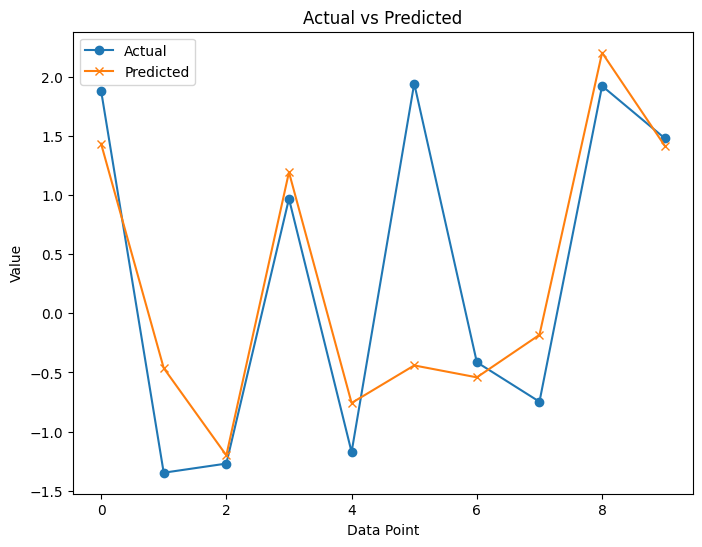

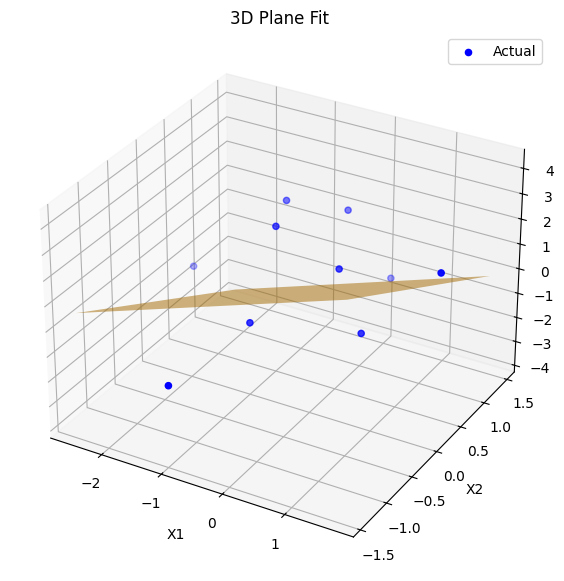

In [32]:

# SGD for Linear Regression
def linear_regression_sgd(X, Y, alpha, max_iter):
    N, d = X.shape
    X_aug = np.hstack((np.ones((N, 1)), X))
    W = np.random.randn(d + 1, 1)

    for k in range(max_iter):
        # Draw a random data point
        i = np.random.randint(N)
        x_i = X_aug[i:i+1, :]  # Shape (1, d+1)
        y_i = Y[i:i+1]  # Shape (1, 1)
        
        # Compute prediction for the selected data point
        y_pred_i = x_i @ W
        error_i = y_pred_i - y_i
        
        # Gradient of the loss function for the selected data point
        grad_i = x_i.T @ error_i
        
        # Update model weights
        W = W - alpha * grad_i

    # Final prediction using all data points
    Y_pred = X_aug @ W
    return W, Y_pred

# Plot Actual vs Predicted values
def plot_actual_vs_predicted(Y, Y_pred):
    plt.figure(figsize=(8, 6))
    plt.plot(Y, label='Actual', marker='o')
    plt.plot(Y_pred, label='Predicted', marker='x')
    plt.xlabel("Data Point")
    plt.ylabel("Value")
    plt.title("Actual vs Predicted")
    plt.legend()
    plt.show()

# 3D Plane Plot with Predictions (uses only two features)
def plot_3d_plane(X, Y, W):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Select only the first two features for 3D plot
    X_subset = X[:, :2]
    X_aug = np.hstack((np.ones((X_subset.shape[0], 1)), X_subset))
    Y_pred = X_aug @ W[:3]  
    ax.scatter(X_subset[:, 0], X_subset[:, 1], Y, color='blue', label="Actual")

    # Surface plot for predicted plane
    x1_range = np.linspace(min(X_subset[:, 0]), max(X_subset[:, 0]), 10)
    x2_range = np.linspace(min(X_subset[:, 1]), max(X_subset[:, 1]), 10)
    x1_grid, x2_grid = np.meshgrid(x1_range, x2_range)
    Z = W[0] + W[1] * x1_grid + W[2] * x2_grid
    ax.plot_surface(x1_grid, x2_grid, Z, color='orange', alpha=0.5, rstride=100, cstride=100)

    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_zlabel("Y")
    ax.set_title("3D Plane Fit")
    ax.legend()
    plt.show()


np.random.seed(0)
X = np.random.randn(10, 10)
Y = np.random.randn(10, 1)
alpha = 0.01
max_iter = 1000


W_final, Y_pred = linear_regression_sgd(X, Y, alpha, max_iter)


plot_actual_vs_predicted(Y, Y_pred)


plot_3d_plane(X, Y, W_final)


# Linear Regression over mini batch sgd

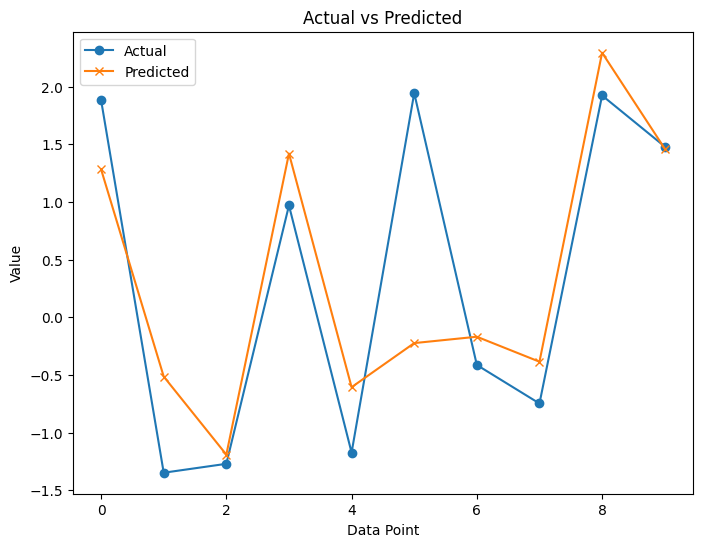

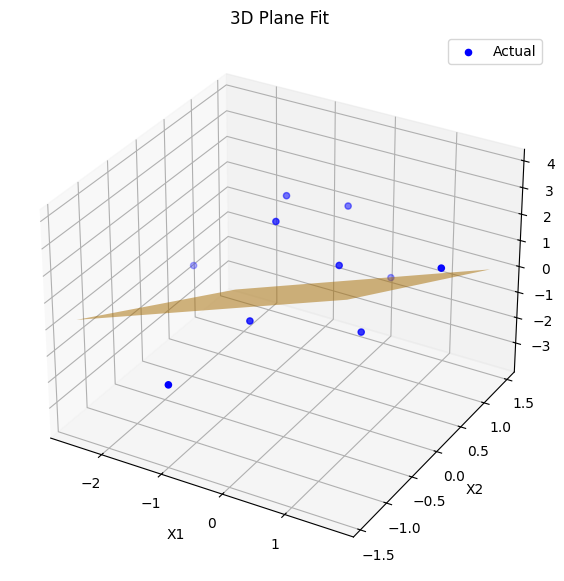

In [33]:

# Mini-batch SGD for Linear Regression
def linear_regression_minibatch_sgd(X, Y, alpha, max_iter, minibatch_size):
    N, d = X.shape
    X_aug = np.hstack((np.ones((N, 1)), X))  
    W = np.random.randn(d + 1, 1)  # Initial weights with bias

    for k in range(max_iter):
        # Shuffle the dataset and create mini-batches
        indices = np.random.permutation(N)
        for i in range(0, N, minibatch_size):
            minibatch_indices = indices[i:i+minibatch_size]
            X_mini = X_aug[minibatch_indices]
            Y_mini = Y[minibatch_indices]
            
            # Compute predictions for the selected mini-batch
            Y_pred_mini = X_mini @ W
            error_mini = Y_pred_mini - Y_mini
            
            # Compute gradient for the mini-batch
            grad_mini = X_mini.T @ error_mini / minibatch_size
            
            # Update weights using the gradient and learning rate
            W = W - alpha * grad_mini

    # Final prediction using all data points
    Y_pred = X_aug @ W
    return W, Y_pred

# Plot Actual vs Predicted values
def plot_actual_vs_predicted(Y, Y_pred):
    plt.figure(figsize=(8, 6))
    plt.plot(Y, label='Actual', marker='o')
    plt.plot(Y_pred, label='Predicted', marker='x')
    plt.xlabel("Data Point")
    plt.ylabel("Value")
    plt.title("Actual vs Predicted")
    plt.legend()
    plt.show()

# 3D Plane Plot with Predictions (uses only two features)
def plot_3d_plane(X, Y, W):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    X_subset = X[:, :2]
    X_aug = np.hstack((np.ones((X_subset.shape[0], 1)), X_subset))
    Y_pred = X_aug @ W[:3]  
    ax.scatter(X_subset[:, 0], X_subset[:, 1], Y, color='blue', label="Actual")

    # Surface plot for predicted plane
    x1_range = np.linspace(min(X_subset[:, 0]), max(X_subset[:, 0]), 10)
    x2_range = np.linspace(min(X_subset[:, 1]), max(X_subset[:, 1]), 10)
    x1_grid, x2_grid = np.meshgrid(x1_range, x2_range)
    Z = W[0] + W[1] * x1_grid + W[2] * x2_grid
    ax.plot_surface(x1_grid, x2_grid, Z, color='orange', alpha=0.5, rstride=100, cstride=100)

    ax.set_xlabel("X1")
    ax.set_ylabel("X2")
    ax.set_zlabel("Y")
    ax.set_title("3D Plane Fit")
    ax.legend()
    plt.show()


np.random.seed(0)
X = np.random.randn(10, 10)  # 10 samples, 10 features
Y = np.random.randn(10, 1)  # 10 target values
alpha = 0.01  # Learning rate
max_iter = 1000  # Number of iterations
minibatch_size = 5  # Mini-batch size

# Train model with Mini-batch SGD
W_final, Y_pred = linear_regression_minibatch_sgd(X, Y, alpha, max_iter, minibatch_size)

# Plot Actual vs Predicted values
plot_actual_vs_predicted(Y, Y_pred)

# Plot 3D plane using only the first two features
plot_3d_plane(X, Y, W_final)


# Logistic Regression 

Iteration 0, Loss: 0.6931471805599436
Iteration 100, Loss: 0.644244643675564
Iteration 200, Loss: 0.6430482526954268
Iteration 300, Loss: 0.6429919897319393
Iteration 400, Loss: 0.6429889646845638
Final optimized weights: [ 0.22435282 -0.59471785  0.34841541]


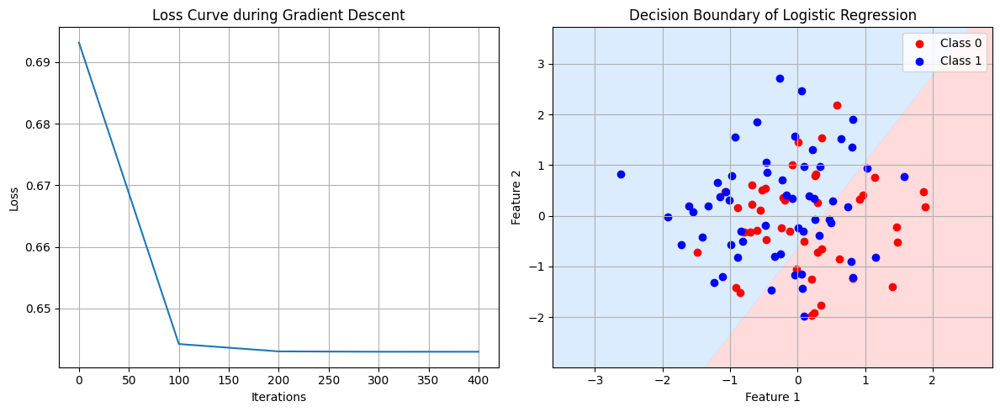

In [34]:

def logistic_regression_GD(X, Y, alpha=0.01, max_it=1000):
    N, d = X.shape
    X = np.hstack([np.ones((N, 1)), X])  
    W = np.zeros(d + 1)  
    loss_history = []
    
    # Gradient Descent
    for k in range(max_it):
        h = 1 / (1 + np.exp(-np.dot(X, W)))
        
        gradient = (1 / N) * np.dot(X.T, (h - Y)) 
        W -= alpha * gradient  
        if k % 100 == 0:
            loss = -np.mean(Y * np.log(h + 1e-15) + (1 - Y) * np.log(1 - h + 1e-15))  
            loss_history.append(loss)
            print(f"Iteration {k}, Loss: {loss}")
    
    return W, loss_history


np.random.seed(42)
N = 100  # Number of data points
d = 2    # Number of features

X = np.random.randn(N, d)

Y = np.random.randint(0, 2, size=N) 
W_final, loss_history = logistic_regression_GD(X, Y, alpha=0.1, max_it=500)
print("Final optimized weights:", W_final)


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(0, 500, 100), loss_history)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Loss Curve during Gradient Descent')
plt.grid(True)

plt.subplot(1, 2, 2)

# Generate a grid of points for decision boundary visualization
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),np.linspace(y_min, y_max, 100))


grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_points_bias = np.hstack([np.ones((grid_points.shape[0], 1)), grid_points])

Z = 1 / (1 + np.exp(-np.dot(grid_points_bias, W_final)))
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, levels=[0, 0.5, 1], colors=['#ffcccc', '#cce5ff'], alpha=0.7)
plt.scatter(X[Y == 0][:, 0], X[Y == 0][:, 1], color='red', label='Class 0')
plt.scatter(X[Y == 1][:, 0], X[Y == 1][:, 1], color='blue', label='Class 1')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of Logistic Regression')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Logistic Regression over SGD

Iteration 0, Loss: 0.6488162272111524
Iteration 100, Loss: 0.6442713266563235
Iteration 200, Loss: 0.6436709985877711
Iteration 300, Loss: 0.6530426172317527
Iteration 400, Loss: 0.6442990813935956
Iteration 500, Loss: 0.6499815027994544
Iteration 600, Loss: 0.6457076705062624
Iteration 700, Loss: 0.6484437314941306
Iteration 800, Loss: 0.6445659502582158
Iteration 900, Loss: 0.6488322231742889
Final optimized weights: [ 0.18295135 -0.5007502   0.58280694]


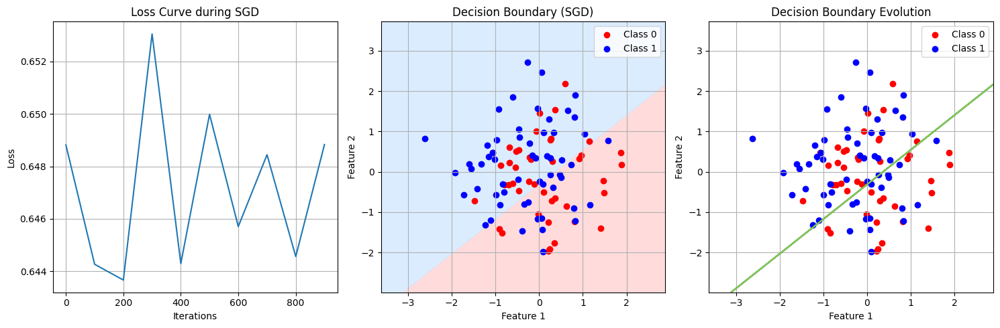

In [35]:
import numpy as np
import matplotlib.pyplot as plt

def logistic_regression_SGD(X, Y, alpha=0.01, max_it=1000, batch_size=1):
    N, d = X.shape
    X = np.hstack([np.ones((N, 1)), X])  # Augment X to include bias term
    
    # Initialize weights (W) to zeros
    W = np.zeros(d + 1)  # Including bias term
    
    # Store loss values for plotting
    loss_history = []
    
    # Number of batches
    n_batches = max(N // batch_size, 1)
    
    # SGD
    for k in range(max_it):
        # Shuffle the data
        indices = np.random.permutation(N)
        X_shuffled = X[indices]
        Y_shuffled = Y[indices]
        
        # Process mini-batches
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = min(start_idx + batch_size, N)
            
            X_batch = X_shuffled[start_idx:end_idx]
            Y_batch = Y_shuffled[start_idx:end_idx]
            
            # Logistic regression hypothesis (sigmoid function)
            h = 1 / (1 + np.exp(-np.dot(X_batch, W)))
            
            # Compute the gradient of the loss function for the batch
            gradient = (1 / len(X_batch)) * np.dot(X_batch.T, (h - Y_batch))
            
            # Update the weights using the batch gradient
            W -= alpha * gradient
        
        # Compute and store the full loss every 100 iterations
        if k % 100 == 0:
            h_full = 1 / (1 + np.exp(-np.dot(X, W)))
            loss = -np.mean(Y * np.log(h_full + 1e-15) + (1 - Y) * np.log(1 - h_full + 1e-15))
            loss_history.append(loss)
            print(f"Iteration {k}, Loss: {loss}")
    
    return W, loss_history



# Generate  data
np.random.seed(42)
N = 100  # Number of data points
d = 2    # Number of features


# Create random feature matrix X (N x d)
X = np.random.randn(N, d)

# Generate random binary labels (0 or 1)
Y = np.random.randint(0, 2, size=N)

# Apply SGD for logistic regression
# Using a larger learning rate since we're doing SGD
W_final, loss_history = logistic_regression_SGD(X, Y, alpha=0.1,max_it=1000,batch_size=1)  # batch_size=1 for pure SGD
print("Final optimized weights:", W_final)

# Create figure for plotting
plt.figure(figsize=(15, 5))

# First plot (loss curve)
plt.subplot(1, 3, 1)
plt.plot(range(0, 1000, 100), loss_history)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Loss Curve during SGD')
plt.grid(True)

# Second plot (decision boundary)
plt.subplot(1, 3, 2)

# Generate a grid of points for decision boundary visualization
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))

# Prepare grid points for prediction
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_points_bias = np.hstack([np.ones((grid_points.shape[0], 1)), grid_points])

# Compute predictions for the grid points
Z = 1 / (1 + np.exp(-np.dot(grid_points_bias, W_final)))
Z = Z.reshape(xx.shape)

# Plot decision boundary and data points
plt.contourf(xx, yy, Z, levels=[0, 0.5, 1], colors=['#ffcccc', '#cce5ff'], alpha=0.7)
plt.scatter(X[Y == 0][:, 0], X[Y == 0][:, 1], color='red', label='Class 0')
plt.scatter(X[Y == 1][:, 0], X[Y == 1][:, 1], color='blue', label='Class 1')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary (SGD)')
plt.legend()
plt.grid(True)

# Third plot (trajectory visualization)
plt.subplot(1, 3, 3)
# Generate predictions for the entire dataset at regular intervals
traj_points = np.linspace(0, len(loss_history)-1, 10).astype(int)
for i, point in enumerate(traj_points):
    plt.contour(xx, yy, Z, levels=[0.5], 
                colors=[plt.cm.viridis(i/len(traj_points))],
                alpha=0.5)
plt.scatter(X[Y == 0][:, 0], X[Y == 0][:, 1], color='red', label='Class 0')
plt.scatter(X[Y == 1][:, 0], X[Y == 1][:, 1], color='blue', label='Class 1')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary Evolution')
plt.legend()
plt.grid(True)

plt.tight_layout()

plt.show()

# Logistic Regression over mini batch sgd


Training with batch size: 1
Iteration 0, Loss: 0.1283837361934601
Iteration 100, Loss: 0.028215159117942666
Iteration 200, Loss: 0.022319664058105673
Iteration 300, Loss: 0.019276901891125013
Iteration 400, Loss: 0.017335776076363458
Iteration 500, Loss: 0.015883719868818588
Iteration 600, Loss: 0.014793433792979057
Iteration 700, Loss: 0.013919588902431102
Iteration 800, Loss: 0.01318347116452689
Iteration 900, Loss: 0.01254763586689895

Training with batch size: 10
Iteration 0, Loss: 0.29062865300033186
Iteration 100, Loss: 0.06032204857391212
Iteration 200, Loss: 0.048187193023317976
Iteration 300, Loss: 0.04223080110483459
Iteration 400, Loss: 0.03844662136998543
Iteration 500, Loss: 0.035735857177132006
Iteration 600, Loss: 0.03365657840451566
Iteration 700, Loss: 0.03198681003306583
Iteration 800, Loss: 0.030600974199102005
Iteration 900, Loss: 0.02942291430171047

Training with batch size: 50
Iteration 0, Loss: 0.4910038311923442
Iteration 100, Loss: 0.10205566781562976
Iterati

C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\2788367911.py:121: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(xx, yy, Z, levels=[0.5],


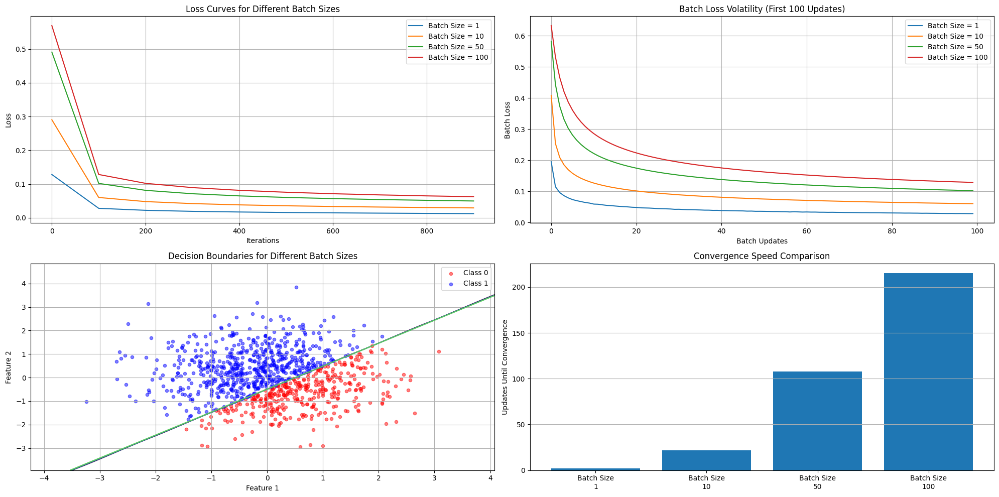

In [36]:

def logistic_regression_BatchSGD(X, Y, batch_size, alpha=0.01, max_it=1000):
    N, d = X.shape
    X = np.hstack([np.ones((N, 1)), X])  # Augment X to include bias term
    
    W = np.zeros(d + 1)  
    loss_history = []
    batch_losses = []  
    n_batches = N // batch_size
    if N % batch_size != 0:
        n_batches += 1
    
    # Batch SGD
    for k in range(max_it):
        indices = np.random.permutation(N)
        X_shuffled = X[indices]
        Y_shuffled = Y[indices]
        
        epoch_batch_losses = []  # Store losses for each batch in this epoch
        
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = min(start_idx + batch_size, N)
            
            X_batch = X_shuffled[start_idx:end_idx]
            Y_batch = Y_shuffled[start_idx:end_idx]
            
            # Logistic regression hypothesis (sigmoid function)
            h = 1 / (1 + np.exp(-np.dot(X_batch, W)))
            
            # Compute the gradient of the loss function for the batch
            gradient = (1 / len(X_batch)) * np.dot(X_batch.T, (h - Y_batch))
            
            # Update the weights using the batch gradient
            W -= alpha * gradient
            
            # Compute batch loss
            batch_loss = -np.mean(Y_batch * np.log(h + 1e-15) + 
                                (1 - Y_batch) * np.log(1 - h + 1e-15))
            epoch_batch_losses.append(batch_loss)
        
        # Store average batch loss for this epoch
        batch_losses.append(np.mean(epoch_batch_losses))
        
        # Compute and store the full loss every 100 iterations
        if k % 100 == 0:
            h_full = 1 / (1 + np.exp(-np.dot(X, W)))
            loss = -np.mean(Y * np.log(h_full + 1e-15) + 
                          (1 - Y) * np.log(1 - h_full + 1e-15))
            loss_history.append(loss)
            print(f"Iteration {k}, Loss: {loss}")
    
    return W, loss_history, batch_losses

# Generate  data
np.random.seed(42)
N = 1000  # Increased number of data points for better batch size comparison
d = 2     # Number of features

# Create random feature matrix X (N x d)
X = np.random.randn(N, d)

# Generate more separable binary labels using a true linear decision boundary
true_w = np.array([1, -2, 2])
X_augmented = np.hstack([np.ones((N, 1)), X])
probabilities = 1 / (1 + np.exp(-np.dot(X_augmented, true_w)))
Y = (probabilities > 0.5).astype(int)

# Try different batch sizes
batch_sizes = [1, 10, 50, 100]
results = {}

for batch_size in batch_sizes:
    print(f"\nTraining with batch size: {batch_size}")
    W_final, loss_history, batch_losses = logistic_regression_BatchSGD(
        X, Y, 
        batch_size=batch_size,
        alpha=0.1,
        max_it=1000
    )
    results[batch_size] = (W_final, loss_history, batch_losses)

# Visualization
plt.figure(figsize=(20, 10))

# Plot 1: Loss curves comparison
plt.subplot(2, 2, 1)
for batch_size in batch_sizes:
    plt.plot(range(0, 1000, 100), 
            results[batch_size][1], 
            label=f'Batch Size = {batch_size}')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Loss Curves for Different Batch Sizes')
plt.legend()
plt.grid(True)

# Plot 2: Batch Loss Volatility
plt.subplot(2, 2, 2)
for batch_size in batch_sizes:
    plt.plot(results[batch_size][2][:100],  # Plot first 100 batch losses
            label=f'Batch Size = {batch_size}')
plt.xlabel('Batch Updates')
plt.ylabel('Batch Loss')
plt.title('Batch Loss Volatility (First 100 Updates)')
plt.legend()
plt.grid(True)

# Plot 3: Decision Boundaries Comparison
plt.subplot(2, 2, 3)
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_points_bias = np.hstack([np.ones((grid_points.shape[0], 1)), grid_points])

for i, batch_size in enumerate(batch_sizes):
    W = results[batch_size][0]
    Z = 1 / (1 + np.exp(-np.dot(grid_points_bias, W)))
    Z = Z.reshape(xx.shape)
    plt.contour(xx, yy, Z, levels=[0.5], 
                colors=[plt.cm.viridis(i/len(batch_sizes))],
                label=f'Batch Size = {batch_size}')

plt.scatter(X[Y == 0][:, 0], X[Y == 0][:, 1], color='red', 
           label='Class 0', alpha=0.5, s=20)
plt.scatter(X[Y == 1][:, 0], X[Y == 1][:, 1], color='blue', 
           label='Class 1', alpha=0.5, s=20)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundaries for Different Batch Sizes')
plt.legend()
plt.grid(True)

# Plot 4: Convergence Speed Comparison
plt.subplot(2, 2, 4)
convergence_threshold = 0.1
epochs_to_converge = {}

for batch_size in batch_sizes:
    losses = results[batch_size][2]
    for i, loss in enumerate(losses):
        if loss < convergence_threshold:
            epochs_to_converge[batch_size] = i
            break
    else:
        epochs_to_converge[batch_size] = len(losses)

plt.bar(range(len(batch_sizes)), 
        [epochs_to_converge[bs] for bs in batch_sizes],
        tick_label=[f'Batch Size\n{bs}' for bs in batch_sizes])
plt.ylabel('Updates Until Convergence')
plt.title('Convergence Speed Comparison')
plt.grid(True, axis='y')

plt.tight_layout()
plt.show()

# Adagrad 

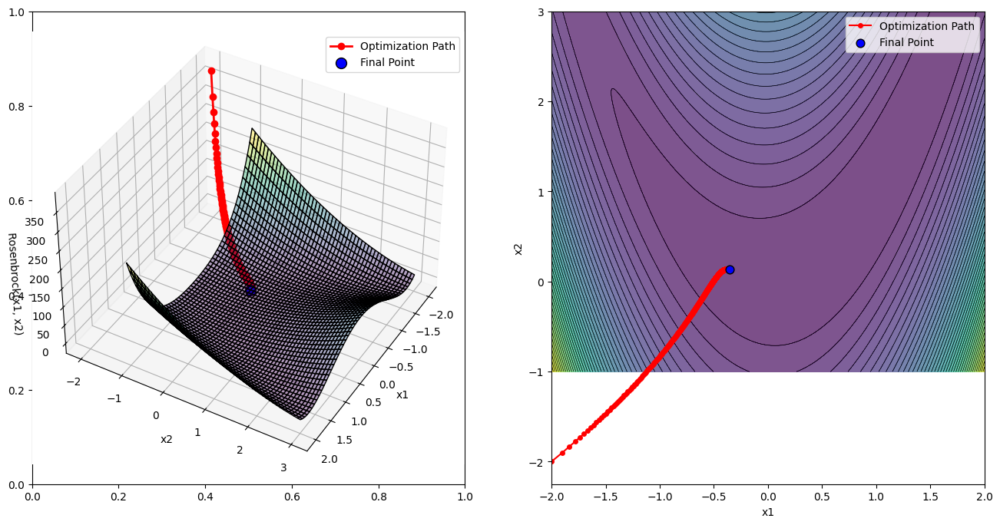

[-0.35620239923472524, 0.13782615384110705]


In [37]:

def adagrad(f, grad_f, x0, epsilon=1e-6, max_iter=1000, alpha=0.1, epsilon_adagrad=1e-8):
    """
    Perform Adagrad optimization in 2D space.
    """
    x_k = np.array(x0)  # Initial point
    G_k = np.zeros_like(x_k)  # Accumulated squared gradients
    visited_points = [x_k.copy()]  # Track visited points
    k = 0

    while k < max_iter:
        grad = np.array(grad_f(x_k[0], x_k[1]))  # Gradient at current point
        grad_norm = np.linalg.norm(grad)

        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        # Update accumulated squared gradients
        G_k += grad**2

        # Update weights using Adagrad
        x_k = x_k - (alpha / (np.sqrt(G_k) + epsilon_adagrad)) * grad
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points

x0 = (-2.00, -2.00)  # Initial point

# Generate a grid for visualization
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)


# Run Adagrad optimization
opt_point_adagrad, visited_points_adagrad = adagrad(Rosenbrock, grad_f, x0, epsilon=1e-6)

# Prepare points for plotting
trial_points_adagrad = [list(x) for x in visited_points_adagrad]

# Plot Rosenbrock function and points visited by Adagrad
plot_rosenbrock_with_points(X1, X2, Z, trial_points_adagrad, trial_num=1, type="adagrad")
print(trial_points_adagrad[-1])

# RMSProps 

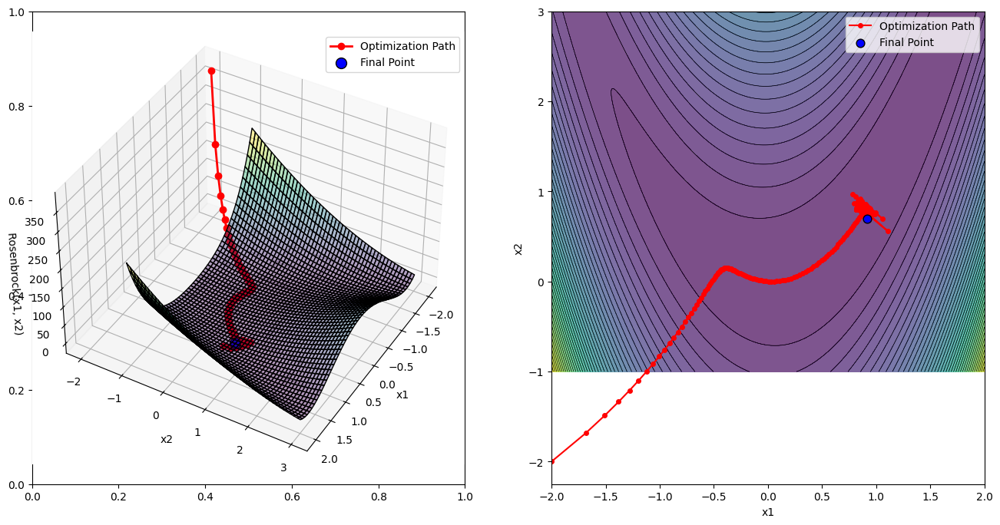

In [38]:


def rmsprop(f, grad_f, x0, epsilon=1e-6, max_iter=1000, alpha=0.1, beta=0.9, epsilon_rmsprop=1e-8):
    """
    Perform RMSProp optimization in 2D space.
    """
    x_k = np.array(x0)  # Initial point
    G_k = np.zeros_like(x_k)  # Accumulated squared gradients
    visited_points = [x_k.copy()]  # Track visited points
    k = 0

    while k < max_iter:
        grad = np.array(grad_f(x_k[0], x_k[1]))  # Gradient at current point
        grad_norm = np.linalg.norm(grad)

        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break

        # Update accumulated squared gradients using Exponentially Weighted Moving Average (EWMA)
        G_k = beta * G_k + (1 - beta) * grad**2

        # Update weights using RMSProp
        x_k = x_k - (alpha / (np.sqrt(G_k) + epsilon_rmsprop)) * grad
        visited_points.append(x_k.copy())

        k += 1

    return x_k, visited_points


x0 = (-2.00, -2.00)  # Initial point

# Generate a grid for visualization
x1 = np.linspace(-2, 2, 400)
x2 = np.linspace(-1, 3, 400)
X1, X2 = np.meshgrid(x1, x2)
Z = Rosenbrock(X1, X2)


# Run RMSProp optimization
opt_point_rmsprop, visited_points_rmsprop = rmsprop(Rosenbrock, grad_f, x0, epsilon=1e-6)

# Prepare points for plotting
trial_points_rmsprop = [list(x) for x in visited_points_rmsprop]

# Plot Rosenbrock function and points visited by RMSProp
plot_rosenbrock_with_points(X1, X2, Z, trial_points_rmsprop, trial_num=1, type="rmsprop")


# Adam 

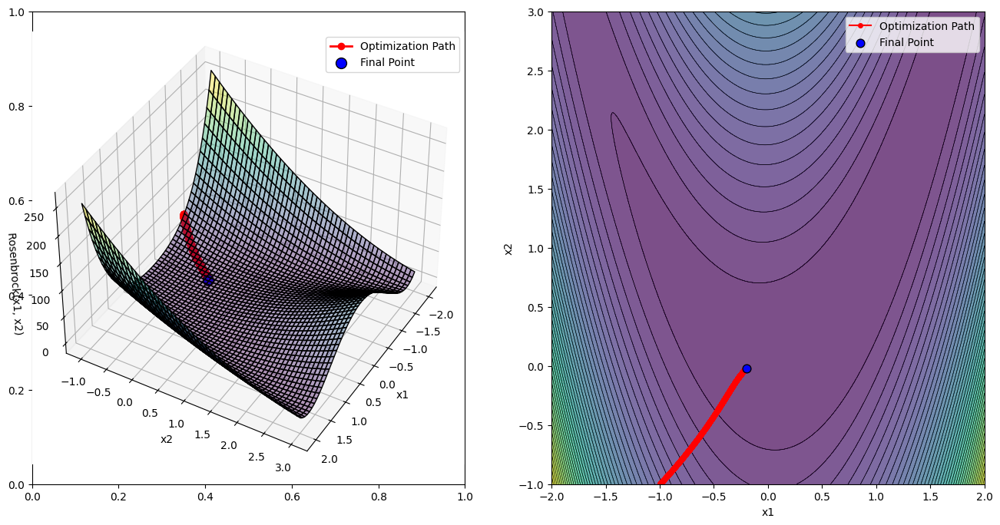

Final position: [-0.19623743 -0.0208328 ]
Final objective value: 1.466198616983418


In [ ]:

def adam(f, grad_f, x0, epsilon=1e-6, max_iter=1000, alpha=0.001, beta1=0.9, beta2=0.999, epsilon_adam=1e-8):
    """
    Perform Adam optimization in 2D space.
    
    Parameters:
    -----------
    f : function
        Objective function to minimize
    grad_f : function
        Gradient of the objective function
    x0 : tuple
        Initial point (x1, x2)
    epsilon : float
        Convergence criterion for gradient norm
    max_iter : int
        Maximum number of iterations
    alpha : float
        Learning rate
    beta1 : float
        Exponential decay rate for first moment estimates
    beta2 : float
        Exponential decay rate for second moment estimates
    epsilon_adam : float
        Small constant to prevent division by zero
    """
    # Convert initial point to numpy array
    x_k = np.array(x0, dtype=float)
    
    # Initialize first and second moment estimates
    m_k = np.zeros_like(x_k)
    v_k = np.zeros_like(x_k)
    
    # Store visited points for visualization
    visited_points = [x_k.copy()]
    
    k = 0
    while k < max_iter:
        # Compute gradient at current point
        grad = np.array(grad_f(x_k[0], x_k[1]))
        
        # Check for convergence
        grad_norm = np.linalg.norm(grad)
        if grad_norm < epsilon:
            print(f"Converged in {k} iterations.")
            break
        
        # Update biased first moment estimate
        m_k = beta1 * m_k + (1 - beta1) * grad
        
        # Update biased second moment estimate
        v_k = beta2 * v_k + (1 - beta2) * np.square(grad)
        
        # Compute bias-corrected first moment estimate
        m_k_hat = m_k / (1 - beta1**(k + 1))
        
        # Compute bias-corrected second moment estimate
        v_k_hat = v_k / (1 - beta2**(k + 1))
        
        # Update parameters
        x_k = x_k - alpha * m_k_hat / (np.sqrt(v_k_hat) + epsilon_adam)
        
        # Store current point
        visited_points.append(x_k.copy())
        
        k += 1
    
    if k == max_iter:
        print("Warning: Maximum iterations reached without convergence.")
    
    return x_k, visited_points

# Test the implementation
if __name__ == "__main__":
    # Set initial point
    x0 = (-1.0, -1.0)
    
    # Generate grid for visualization
    x1 = np.linspace(-2, 2, 400)
    x2 = np.linspace(-1, 3, 400)
    X1, X2 = np.meshgrid(x1, x2)
    Z = Rosenbrock(X1, X2)
    
    # Run Adam optimization
    opt_point_adam, visited_points_adam = adam(
        Rosenbrock, 
        grad_f, 
        x0, 
        epsilon=1e-6,
        alpha=0.001,  # Try adjusting this if convergence is poor
        max_iter=2000  # Increased from 1000
    )
    
    # Plot results
    plot_rosenbrock_with_points(X1, X2, Z, visited_points_adam, trial_num=1, type="adam")
    
    print(f"Final position: {opt_point_adam}")
    print(f"Final objective value: {Rosenbrock(opt_point_adam[0], opt_point_adam[1])}")

# Comparision between the gd , sgd , batchgd , adagrad ,rmsprop , adam

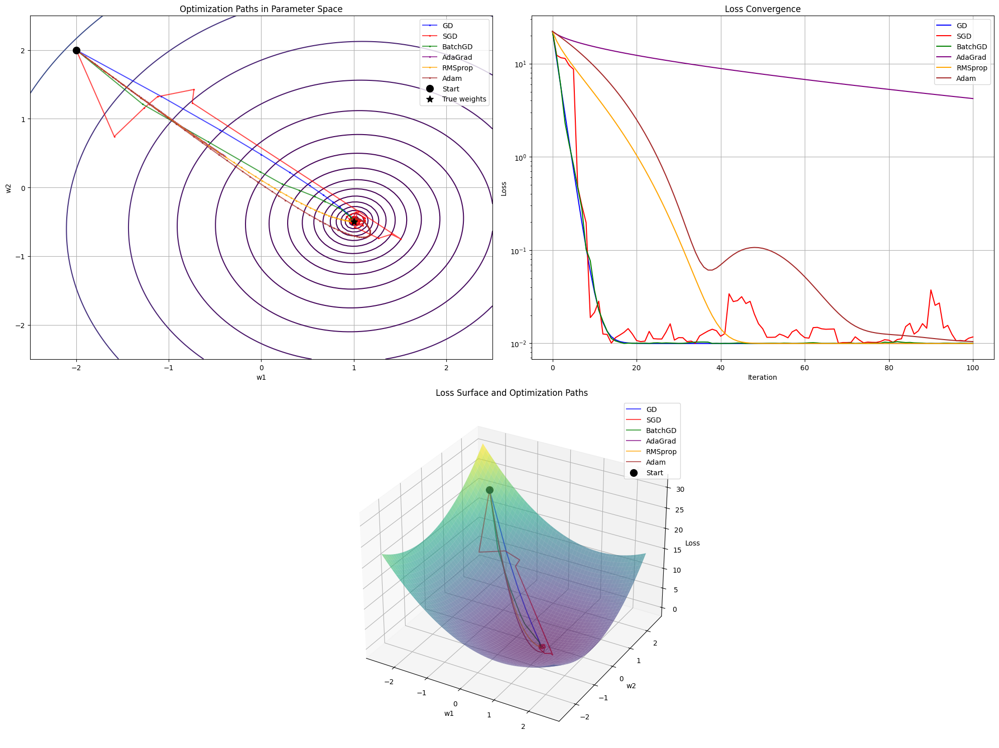


Final Losses:
GD: 0.009955
SGD: 0.011708
BatchGD: 0.010009
AdaGrad: 4.218112
RMSprop: 0.009955
Adam: 0.010429


In [42]:

# Set random seed for reproducibility
np.random.seed(42)

# Generate synthetic data
n_samples = 100
X = np.random.uniform(-2, 2, (n_samples, 2))
true_w = np.array([1, -0.5])
y = np.dot(X, true_w) + np.random.normal(0, 0.1, n_samples)

# Create mesh grid for contour plot
x1_range = np.linspace(-2.5, 2.5, 100)
x2_range = np.linspace(-2.5, 2.5, 100)
X1, X2 = np.meshgrid(x1_range, x2_range)
Z = np.zeros_like(X1)

# Calculate loss surface
for i in range(len(x1_range)):
    for j in range(len(x2_range)):
        w = np.array([X1[i,j], X2[i,j]])
        predictions = np.dot(X, w)
        Z[i,j] = np.mean((predictions - y) ** 2)

# Set same initial point for all methods
initial_w = np.array([-2.0, 2.0])

# Optimization functions
def gradient_descent(X, y, w_init, learning_rate=0.1, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    
    for _ in range(n_iterations):
        gradient = 2 * X.T.dot(X.dot(w) - y) / len(y)
        w -= learning_rate * gradient
        path.append(w.copy())
    
    return np.array(path)

def sgd(X, y, w_init, learning_rate=0.1, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    
    for _ in range(n_iterations):
        idx = np.random.randint(len(y))
        gradient = 2 * X[idx].T.dot(X[idx].dot(w) - y[idx])
        w -= learning_rate * gradient
        path.append(w.copy())
    
    return np.array(path)

def mini_batch_sgd(X, y, w_init, batch_size=32, learning_rate=0.1, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    
    for _ in range(n_iterations):
        indices = np.random.choice(len(y), batch_size)
        X_batch, y_batch = X[indices], y[indices]
        gradient = 2 * X_batch.T.dot(X_batch.dot(w) - y_batch) / batch_size
        w -= learning_rate * gradient
        path.append(w.copy())
    
    return np.array(path)

def adagrad(X, y, w_init, learning_rate=0.1, epsilon=1e-8, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    G = np.zeros_like(w)
    
    for _ in range(n_iterations):
        gradient = 2 * X.T.dot(X.dot(w) - y) / len(y)
        G += gradient ** 2
        adjusted_gradient = gradient / (np.sqrt(G + epsilon))
        w -= learning_rate * adjusted_gradient
        path.append(w.copy())
    
    return np.array(path)

def rmsprop(X, y, w_init, learning_rate=0.1, beta=0.9, epsilon=1e-8, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    v = np.zeros_like(w)
    
    for _ in range(n_iterations):
        gradient = 2 * X.T.dot(X.dot(w) - y) / len(y)
        v = beta * v + (1 - beta) * (gradient ** 2)
        adjusted_gradient = gradient / (np.sqrt(v + epsilon))
        w -= learning_rate * adjusted_gradient
        path.append(w.copy())
    
    return np.array(path)

def adam(X, y, w_init, learning_rate=0.1, beta1=0.9, beta2=0.999, epsilon=1e-8, n_iterations=100):
    w = w_init.copy()
    path = [w.copy()]
    m = np.zeros_like(w)
    v = np.zeros_like(w)
    
    for t in range(1, n_iterations + 1):
        gradient = 2 * X.T.dot(X.dot(w) - y) / len(y)
        
        m = beta1 * m + (1 - beta1) * gradient
        v = beta2 * v + (1 - beta2) * (gradient ** 2)
        
        m_hat = m / (1 - beta1 ** t)
        v_hat = v / (1 - beta2 ** t)
        
        w -= learning_rate * m_hat / (np.sqrt(v_hat) + epsilon)
        path.append(w.copy())
    
    return np.array(path)

# Run optimizations
learning_rate = 0.1
n_iterations = 100
batch_size = 32

optimizers = {
    'GD': gradient_descent(X, y, initial_w, learning_rate, n_iterations),
    'SGD': sgd(X, y, initial_w, learning_rate, n_iterations),
    'BatchGD': mini_batch_sgd(X, y, initial_w, batch_size, learning_rate, n_iterations),
    'AdaGrad': adagrad(X, y, initial_w, learning_rate, n_iterations=n_iterations),
    'RMSprop': rmsprop(X, y, initial_w, learning_rate, n_iterations=n_iterations),
    'Adam': adam(X, y, initial_w, learning_rate, n_iterations=n_iterations)
}

# Colors and markers for different optimizers
style_dict = {
    'GD': ('blue', '-'),
    'SGD': ('red', '-'),
    'BatchGD': ('green', '-'),
    'AdaGrad': ('purple', '-'),
    'RMSprop': ('orange', '-'),
    'Adam': ('brown', '-')
}

# Create visualization
plt.figure(figsize=(20, 15))

# Plot 1: Contour plot with optimization paths
plt.subplot(221)
plt.contour(X1, X2, Z, levels=np.logspace(-2, 2, 20))
for name, path in optimizers.items():
    color, linestyle = style_dict[name]
    plt.plot(path[:,0], path[:,1], color=color, linestyle=linestyle, marker='.', 
             markersize=3, label=name, alpha=0.7)
plt.plot(initial_w[0], initial_w[1], 'ko', label='Start', markersize=10)
plt.plot(true_w[0], true_w[1], 'k*', label='True weights', markersize=10)
plt.xlabel('w1')
plt.ylabel('w2')
plt.title('Optimization Paths in Parameter Space')
plt.legend()
plt.grid(True)

# Plot 2: Loss convergence
plt.subplot(222)
for name, path in optimizers.items():
    color, linestyle = style_dict[name]
    loss = [np.mean((np.dot(X, w) - y) ** 2) for w in path]
    plt.plot(loss, color=color, linestyle=linestyle, label=name)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss Convergence')
plt.legend()
plt.grid(True)
plt.yscale('log')

# Plot 3: 3D surface plot
ax = plt.subplot(212, projection='3d')
surf = ax.plot_surface(X1, X2, Z, cmap='viridis', alpha=0.6)
for name, path in optimizers.items():
    color, _ = style_dict[name]
    loss = [np.mean((np.dot(X, w) - y) ** 2) for w in path]
    ax.plot(path[:,0], path[:,1], loss, color=color, label=name, alpha=0.7)
ax.scatter(initial_w[0], initial_w[1], np.mean((np.dot(X, initial_w) - y) ** 2), 
          color='black', s=100, label='Start')
ax.set_xlabel('w1')
ax.set_ylabel('w2')
ax.set_zlabel('Loss')
ax.set_title('Loss Surface and Optimization Paths')
ax.legend()
plt.tight_layout()
plt.show()

# Print final losses
print("\nFinal Losses:")
for name, path in optimizers.items():
    final_loss = np.mean((np.dot(X, path[-1]) - y) ** 2)
    print(f"{name}: {final_loss:.6f}")

# Sub- Gradient

In [15]:
def func1(x1, x2):
    return x1 + 2 * np.abs(x2)

In [16]:
def approximate_subgradient(f, x, epsilon=1e-6):
    """
    Compute an approximate subgradient of a function f at point x.
    """
    subgrad = np.zeros_like(x)
    for i in range(len(x)):
        x_plus = np.array(x, dtype=float)
        x_minus = np.array(x, dtype=float)
        x_plus[i] += epsilon
        x_minus[i] -= epsilon
        subgrad[i] = (f(x_plus[0], x_plus[1]) - f(x_minus[0], x_minus[1])) / (2 * epsilon)
    return subgrad

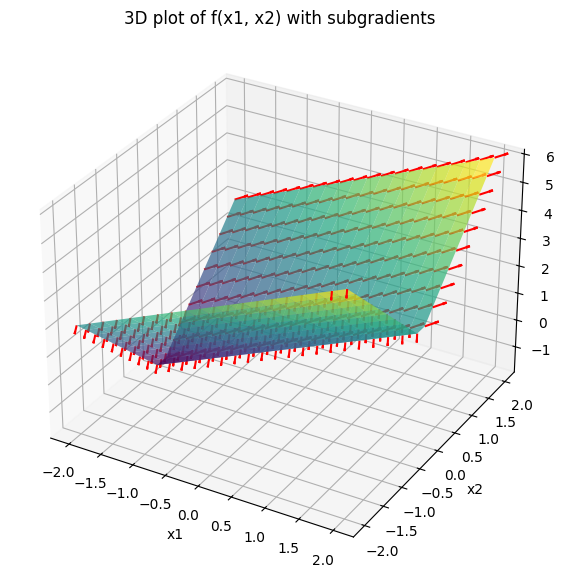

In [17]:
x1_vals = np.linspace(-2, 2, 20)
x2_vals = np.linspace(-2, 2, 20)
X1, X2 = np.meshgrid(x1_vals, x2_vals)
Z = func1(X1, X2)

# Plotting the function and subgradients
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, Z, cmap='viridis', alpha=0.7)

# Plotting the subgradients as arrows
for x1 in x1_vals:
    for x2 in x2_vals:
        g = approximate_subgradient(lambda x1, x2: func1(x1, x2), [x1, x2])
        z = func1(x1, x2)
        ax.quiver(x1, x2, z, g[0], g[1], 0, length=0.1, color='red')

# Set labels and title
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_zlabel("f(x1, x2)")
ax.set_title("3D plot of f(x1, x2) with subgradients")

plt.show()

# LASSO

In [18]:

def lasso_loss(X, Y, W, lambda_):
    """Lasso loss function."""
    residual = Y - X @ W
    return 0.5 * np.sum(residual ** 2) + lambda_ * np.sum(np.abs(W))

def subgradient_lasso(X, Y, W, lambda_):
    """Compute subgradient of Lasso loss function."""
    residual = Y - X @ W
    grad = -X.T @ residual
    subgrad = grad + lambda_ * np.sign(W)
    return subgrad

def gradient_descent_lasso(X, Y, lambda_, initial_w, num_iterations=100, constant_step=0.1):
    """Perform gradient descent on the Lasso loss."""
    ws_constant, ws_diminishing = [initial_w.copy()], [initial_w.copy()]
    w_const, w_dim = initial_w.copy(), initial_w.copy()

    for k in range(1, num_iterations + 1):
        # Compute subgradient
        subgrad_const = subgradient_lasso(X, Y, w_const, lambda_)
        subgrad_dim = subgradient_lasso(X, Y, w_dim, lambda_)

        # Constant step size
        w_const = w_const - constant_step * subgrad_const
        ws_constant.append(w_const.copy())

        # Diminishing step size
        diminishing_step = constant_step / k
        w_dim = w_dim - diminishing_step * subgrad_dim
        ws_diminishing.append(w_dim.copy())

    return np.array(ws_constant), np.array(ws_diminishing)

## Example

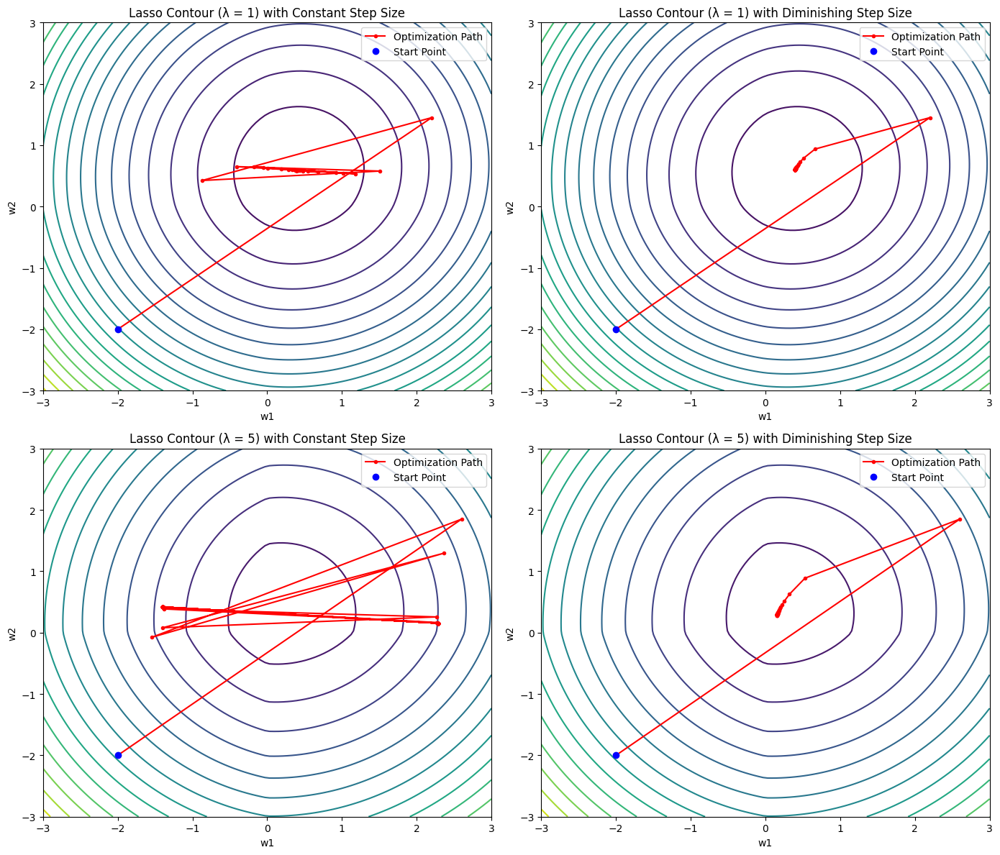

In [19]:
X = np.array([
    [0.5, 1], [1.5, -2], [-1, 1], [-0.5, -1.5],
    [2, 0.5], [0, 1.5], [-1.5, -0.5], [1, -1],
    [1.5, 1], [-2, 0]
])
Y = np.array([1, -1, 0, 0, 1, 2, -2, 0, 1, -1])

# Parameters for the optimization
lambdas = [1, 5]
initial_w = np.array([-2, -2])

# Generate contour plots and optimization paths
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
step_size = 0.1
num_iterations = 50

for idx, lambda_ in enumerate(lambdas):
    # Compute Lasso loss values on a grid for contour plotting
    w1_vals = np.linspace(-3, 3, 100)
    w2_vals = np.linspace(-3, 3, 100)
    W1, W2 = np.meshgrid(w1_vals, w2_vals)
    Z = np.array([[lasso_loss(X, Y, np.array([w1, w2]), lambda_) for w1, w2 in zip(w1_row, w2_row)] for w1_row, w2_row in zip(W1, W2)])

    # Perform gradient descent
    ws_constant, ws_diminishing = gradient_descent_lasso(X, Y, lambda_, initial_w, num_iterations=num_iterations, constant_step=step_size)

    # Plot contour map with constant step size path
    ax = axes[idx, 0]
    ax.contour(W1, W2, Z, levels=20, cmap='viridis')
    ax.plot(ws_constant[:, 0], ws_constant[:, 1], 'ro-', markersize=3, label='Optimization Path')
    ax.plot(initial_w[0], initial_w[1], 'bo', label='Start Point')
    ax.set_title(f"Lasso Contour (λ = {lambda_}) with Constant Step Size")
    ax.set_xlabel("w1")
    ax.set_ylabel("w2")
    ax.legend()

    # Plot contour map with diminishing step size path
    ax = axes[idx, 1]
    ax.contour(W1, W2, Z, levels=20, cmap='viridis')
    ax.plot(ws_diminishing[:, 0], ws_diminishing[:, 1], 'ro-', markersize=3, label='Optimization Path')
    ax.plot(initial_w[0], initial_w[1], 'bo', label='Start Point')
    ax.set_title(f"Lasso Contour (λ = {lambda_}) with Diminishing Step Size")
    ax.set_xlabel("w1")
    ax.set_ylabel("w2")
    ax.legend()

plt.tight_layout()
plt.show()

# Newton Method

In [20]:
# Damped Newton Method
def damped_newton(f, grad_f, hess_f, x0, lambda_factor=0.1, epsilon=1e-6, max_iters=100):
    x = x0
    path = [x.copy()]
    for _ in range(max_iters):
        grad = grad_f(x)
        if norm(grad) < epsilon:
            break
        H = hess_f(x)
        try:
            # If Hessian is positive definite, perform Cholesky decomposition
            L = cholesky(H + lambda_factor * np.eye(len(x)))  # Damping term to ensure PD
            delta = -np.linalg.solve(L.T, np.linalg.solve(L, grad))
        except LinAlgError:
            # If not PD, add lambda_factor to make it PD and retry
            delta = -np.linalg.solve(H + lambda_factor * np.eye(len(x)), grad)
        x = x + delta
        path.append(x.copy())
    return np.array(path)

# Gradient Descent Method
def gradient_descent_newton(grad_f, x0, alpha=0.1, epsilon=1e-6, max_iters=100):
    x = x0
    path = [x.copy()]
    for _ in range(max_iters):
        grad = grad_f(x)
        if norm(grad) < epsilon:
            break
        x = x - alpha * grad
        path.append(x.copy())
    return np.array(path)

# Plotting function
def plot_contours_and_paths(f, grad_path, newton_path, title, xlims=(-3, 3), ylims=(-3, 3)):
    x = np.linspace(xlims[0], xlims[1], 100)
    y = np.linspace(ylims[0], ylims[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = np.vectorize(lambda x, y: f([x, y]))(X, Y)

    plt.contour(X, Y, Z, levels=20, cmap='viridis')
    plt.plot(grad_path[:, 0], grad_path[:, 1], 'r-o', markersize=3, label="GD Path")
    plt.plot(newton_path[:, 0], newton_path[:, 1], 'g-o', markersize=3, label="Newton Path")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(title)
    plt.legend()
    plt.colorbar(label="Function Value")

## Usage

In [21]:
# Define the functions, gradients, and Hessians
def f1(x):  # f1(x, y) = x^2 + y^2
    return x[0]**2 + x[1]**2

def grad_f1(x):
    return np.array([2 * x[0], 2 * x[1]])

def hess_f1(x):
    return np.array([[2, 0], [0, 2]])

def f2(x):  # f2(x, y) = 2*x^2 + 0.5*y^2
    return 2 * x[0]**2 + 0.5 * x[1]**2

def grad_f2(x):
    return np.array([4 * x[0], x[1]])

def hess_f2(x):
    return np.array([[4, 0], [0, 1]])

def f3(x):  # f3(x, y) = x^2 + 10*y^2
    return x[0]**2 + 10 * x[1]**2

def grad_f3(x):
    return np.array([2 * x[0], 20 * x[1]])

def hess_f3(x):
    return np.array([[2, 0], [0, 20]])

def f4(x):  # f4(x, y) = x^2 + 5*y^2
    return x[0]**2 + 5 * x[1]**2

def grad_f4(x):
    return np.array([2 * x[0], 10 * x[1]])

def hess_f4(x):
    return np.array([[2, 0], [0, 10]])

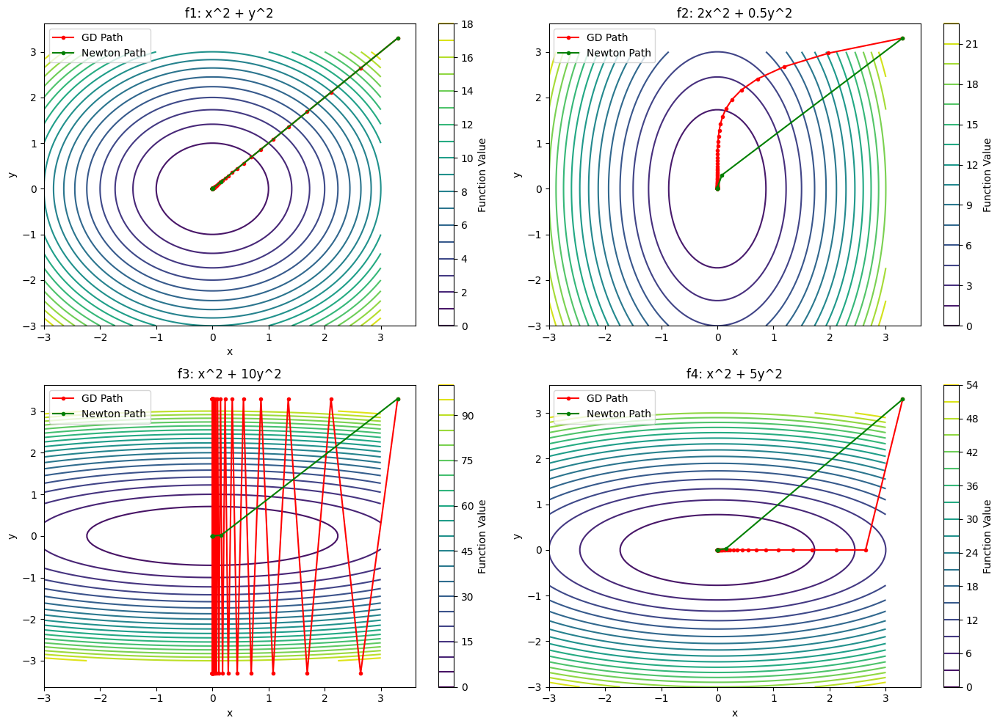

In [22]:
# Initial seed and damping factor
x0 = np.array([3.3, 3.3])
lambda_factor = 0.1

# Perform optimization and plotting for each function
plt.figure(figsize=(14, 10))
functions = [(f1, grad_f1, hess_f1, "f1: x^2 + y^2"),
             (f2, grad_f2, hess_f2, "f2: 2x^2 + 0.5y^2"),
             (f3, grad_f3, hess_f3, "f3: x^2 + 10y^2"),
             (f4, grad_f4, hess_f4, "f4: x^2 + 5y^2")]

for i, (f, grad_f, hess_f, title) in enumerate(functions, 1):
    plt.subplot(2, 2, i)
    gd_path = gradient_descent_newton(grad_f, x0, alpha=0.1, max_iters=100)
    newton_path = damped_newton(f, grad_f, hess_f, x0, lambda_factor=lambda_factor, max_iters=100)
    plot_contours_and_paths(f, gd_path, newton_path, title)

plt.tight_layout()
plt.show()

# BFGS

In [23]:
def bfgs_optimize(f, grad_f, x0, epsilon=1e-6, max_iter=100):
    """
    BFGS optimization algorithm

    Args:
        f (callable): Objective function
        grad_f (callable): Gradient function
        x0 (np.ndarray): Initial point
        epsilon (float): Convergence criterion
        max_iter (int): Maximum iterations

    Returns:
        np.ndarray: Path of optimization points
    """
    n = len(x0)
    x_k = x0.copy()
    H_k = np.eye(n)
    g_k = grad_f(x_k)
    path = [x_k.copy()]

    for k in range(max_iter):
        if norm(g_k) < epsilon:
            break

        # Compute search direction
        p_k = -H_k @ g_k

        # Line search
        alpha = line_search(f, grad_f, x_k, p_k)[0]
        if alpha is None:
            alpha = 0.1

        # Update position
        x_k1 = x_k + alpha * p_k
        g_k1 = grad_f(x_k1)

        # Compute differences
        s_k = x_k1 - x_k
        y_k = g_k1 - g_k

        # BFGS update
        try:
            rho_k = 1.0 / (y_k @ s_k)
            I = np.eye(n)
            H_k = (I - rho_k * np.outer(s_k, y_k)) @ H_k @ (I - rho_k * np.outer(y_k, s_k)) + rho_k * np.outer(s_k, s_k)
        except:
            # If update fails, reset Hessian approximation
            H_k = np.eye(n)

        x_k = x_k1
        g_k = g_k1
        path.append(x_k.copy())

    return np.array(path)

def plot_optimization_paths(f, grad_f, hess_f, x0, bounds, title, functions_dict):
    """
    Plot optimization comparison between different methods

    Args:
        f (callable): Objective function
        grad_f (callable): Gradient function
        hess_f (callable): Hessian function
        x0 (np.ndarray): Initial point
        bounds (tuple): Plot bounds ((x_min, x_max), (y_min, y_max))
        title (str): Plot title
        functions_dict (dict): Dictionary of optimization functions to compare
    """
    plt.figure(figsize=(12, 8))

    # Create contour plot
    x = np.linspace(bounds[0][0], bounds[0][1], 100)
    y = np.linspace(bounds[1][0], bounds[1][1], 100)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i,j] = f(np.array([X[i,j], Y[i,j]]))

    # Plot contours
    plt.contour(X, Y, Z, levels=50, colors='lightgray', alpha=0.6)

    # Colors for different methods
    colors = ['b', 'r', 'g', 'y']

    # Run and plot each optimization method
    for (method_name, method_func), color in zip(functions_dict.items(), colors):
        try:
            if method_name == "Damped Newton":
                path = method_func(f, grad_f, hess_f, x0)
            elif method_name == "Gradient Descent":
                path = method_func(grad_f, x0)[0]  # Note: Original function returns tuple
            else:
                path = method_func(f, grad_f, x0)

            plt.plot(path[:,0], path[:,1], f'{color}.-',
                    label=f'{method_name} ({len(path)} iter)',
                    linewidth=1.5, markersize=4)
        except Exception as e:
            print(f"Error running {method_name}: {e}")

    # Plot initial point
    plt.plot(x0[0], x0[1], 'ko', label='Initial point')

    # Formatting
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.title(title)
    plt.xlabel('x₁')
    plt.ylabel('x₂')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

## Plotting examples

In [24]:
def f1(x):
    return 0.5 * (2*x[0]**2 + 3*x[1]**2) - (x[0] + x[1])

def grad_f1(x):
    return np.array([2*x[0] - 1, 3*x[1] - 1])

def hess_f1(x):
    return np.array([[2, 0], [0, 3]])

def f2(x):
    return 0.5 * (2*x[0]**2 + 20*x[1]**2) - (x[0] + x[1])

def grad_f2(x):
    return np.array([2*x[0] - 1, 20*x[1] - 1])

def hess_f2(x):
    return np.array([[2, 0], [0, 20]])

def f3(x):
    return (1 - x[0])**2 + 10*(x[1] - x[0]**2)**2

def grad_f3(x):
    return np.array([
        -2*(1 - x[0]) - 40*x[0]*(x[1] - x[0]**2),
        20*(x[1] - x[0]**2)
    ])

def hess_f3(x):
    return np.array([
        [120*x[0]**2 - 40*x[1] + 2, -40*x[0]],
        [-40*x[0], 20]
    ])

Error running Gradient Descent: too many indices for array: array is 1-dimensional, but 2 were indexed


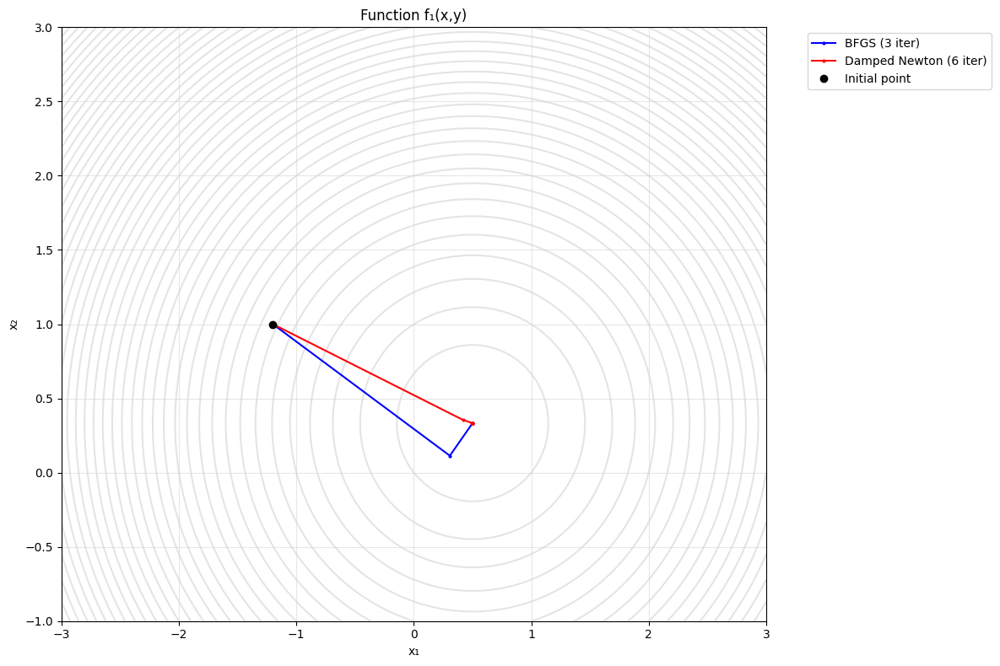

Error running Gradient Descent: too many indices for array: array is 1-dimensional, but 2 were indexed


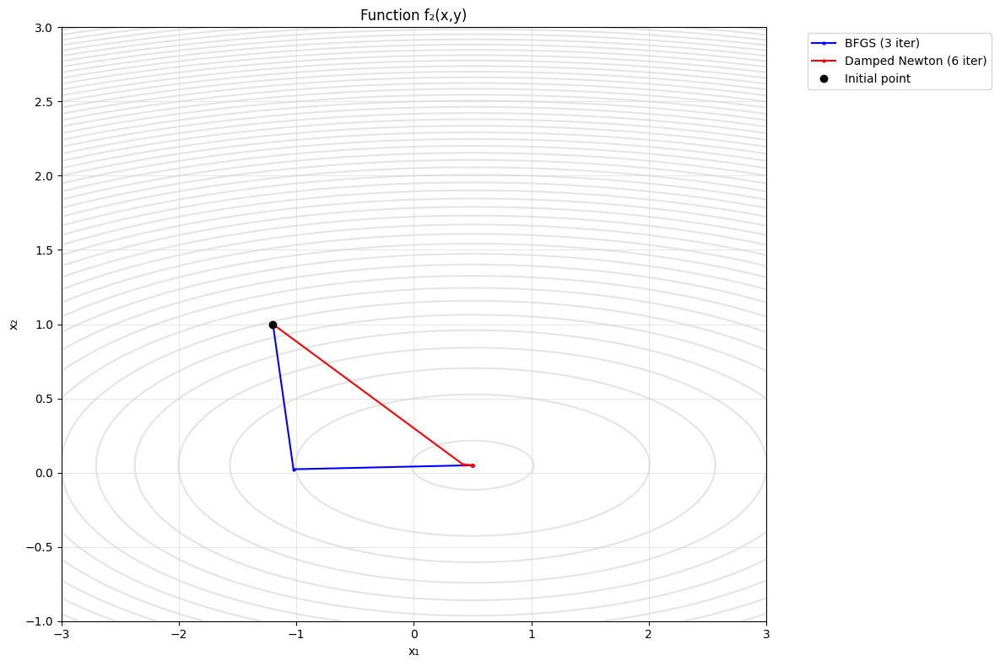

C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\3983916339.py:24: RuntimeWarning: overflow encountered in scalar power
  -2*(1 - x[0]) - 40*x[0]*(x[1] - x[0]**2),
C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\3983916339.py:25: RuntimeWarning: overflow encountered in scalar power
  20*(x[1] - x[0]**2)
C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\3983916339.py:24: RuntimeWarning: invalid value encountered in scalar subtract
  -2*(1 - x[0]) - 40*x[0]*(x[1] - x[0]**2),
C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\3983916339.py:25: RuntimeWarning: invalid value encountered in scalar subtract
  20*(x[1] - x[0]**2)


Error running Gradient Descent: too many indices for array: array is 1-dimensional, but 2 were indexed


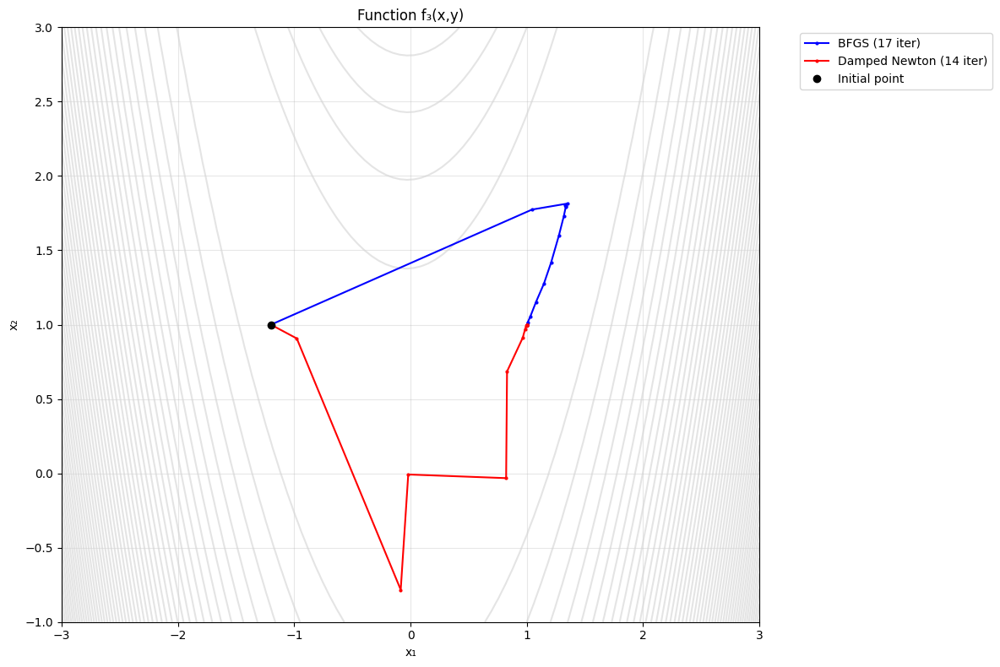

In [25]:
x0 = np.array([-1.2, 1.0])
bounds = ((-3, 3), (-1, 3))

optimization_methods = {
    "BFGS": lambda f, g, x0: bfgs_optimize(f, g, x0),
    "Damped Newton": lambda f, g, h, x0: damped_newton(f, g, h, x0),
    "Gradient Descent": lambda g, x0: gradient_descent_newton(g, x0)
}

# Plot all three functions
test_functions = [
    (f1, grad_f1, hess_f1, "Function f₁(x,y)"),
    (f2, grad_f2, hess_f2, "Function f₂(x,y)"),
    (f3, grad_f3, hess_f3, "Function f₃(x,y)")
]

for f, grad_f, hess_f, title in test_functions:
    plot_optimization_paths(f, grad_f, hess_f, x0, bounds, title, optimization_methods)

# Conjugate Gradient

In [26]:
def f(x):
    """Quadratic function f(x) = x^T A x + b^T x + c"""
    A = np.array([[1.0, 0.5],
                  [0.5, 2.0]])
    b = np.array([-1.0, -2.0])
    c = 1.0
    x = np.array(x).reshape(-1, 1)  # Ensure x is a column vector
    return float(0.5 * x.T @ A @ x + b.T @ x + c)

def grad_f(x):
    """Gradient of the quadratic function"""
    A = np.array([[1.0, 0.5],
                  [0.5, 2.0]])
    b = np.array([-1.0, -2.0])
    x = np.array(x)  # Ensure x is a numpy array
    return A @ x + b

def hess_f(x):
    """Hessian of the quadratic function"""
    return np.array([[1.0, 0.5],
                    [0.5, 2.0]])

# Conjugate Gradient Method
def conjugate_gradient(grad_f, x0, epsilon=1e-6, max_iters=100):
    x = np.array(x0)
    r = -grad_f(x)
    d = r.copy()
    path = [x.copy()]

    for _ in range(max_iters):
        if norm(r) < epsilon:
            break

        # Compute Hessian-vector product
        Hd = grad_f(x + 1e-7 * d) - grad_f(x)
        Hd = Hd / 1e-7

        alpha = (r @ r) / (d @ Hd)
        x = x + alpha * d
        r_new = r - alpha * Hd
        beta = (r_new @ r_new) / (r @ r)
        d = r_new + beta * d
        r = r_new

        path.append(x.copy())

    return np.array(path)

## comparison with newton method, gradient method and conjugate gradient method

C:\Users\Naman\AppData\Local\Temp\ipykernel_13136\1401340688.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(0.5 * x.T @ A @ x + b.T @ x + c)


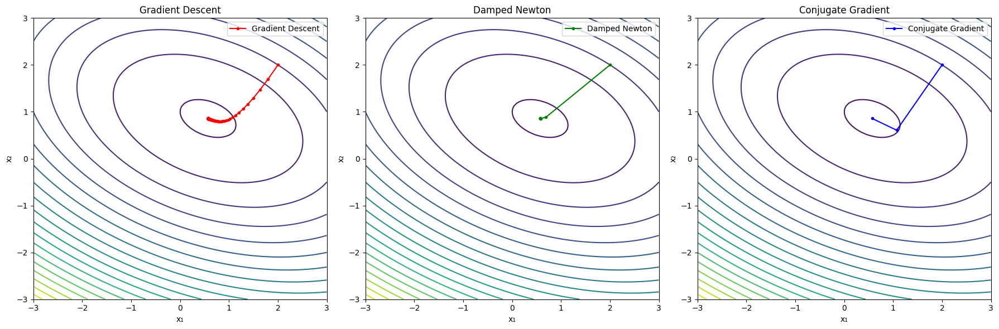

Gradient Descent iterations: 101
Damped Newton iterations: 8
Conjugate Gradient iterations: 3


In [27]:
def compare_optimization_methods(f, grad_f, hess_f, x0):
    # Run all optimization methods
    gd_path = gradient_descent_newton(grad_f, x0, alpha=0.1)
    newton_path = damped_newton(f, grad_f, hess_f, x0)
    cg_path = conjugate_gradient(grad_f, x0)

    # Create figure with three subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot settings
    xlims = (-3, 3)
    ylims = (-3, 3)
    x = np.linspace(xlims[0], xlims[1], 100)
    y = np.linspace(ylims[0], ylims[1], 100)
    X, Y = np.meshgrid(x, y)

    # Vectorize the function properly
    Z = np.array([[f([xi, yi]) for xi in x] for yi in y])

    # Plot for Gradient Descent
    axes[0].contour(X, Y, Z, levels=20, cmap='viridis')
    axes[0].plot(gd_path[:, 0], gd_path[:, 1], 'r.-', label="Gradient Descent")
    axes[0].set_title("Gradient Descent")
    axes[0].set_xlabel("x₁")
    axes[0].set_ylabel("x₂")
    axes[0].legend()

    # Plot for Damped Newton
    axes[1].contour(X, Y, Z, levels=20, cmap='viridis')
    axes[1].plot(newton_path[:, 0], newton_path[:, 1], 'g.-', label="Damped Newton")
    axes[1].set_title("Damped Newton")
    axes[1].set_xlabel("x₁")
    axes[1].set_ylabel("x₂")
    axes[1].legend()

    # Plot for Conjugate Gradient
    axes[2].contour(X, Y, Z, levels=20, cmap='viridis')
    axes[2].plot(cg_path[:, 0], cg_path[:, 1], 'b.-', label="Conjugate Gradient")
    axes[2].set_title("Conjugate Gradient")
    axes[2].set_xlabel("x₁")
    axes[2].set_ylabel("x₂")
    axes[2].legend()

    plt.tight_layout()
    plt.show()

    # Print iteration counts
    print(f"Gradient Descent iterations: {len(gd_path)}")
    print(f"Damped Newton iterations: {len(newton_path)}")
    print(f"Conjugate Gradient iterations: {len(cg_path)}")

# Run the comparison
x0 = np.array([2.0, 2.0])
compare_optimization_methods(f, grad_f, hess_f, x0)
